In [1]:
import datetime

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
from scipy.stats import gaussian_kde

WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'


In [2]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 22})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

In [3]:
# commission cutoffs for each market. 
# These cutoffs were determined by looking at the plots in buyside_commission_plots.ipynb
market_area_to_commission_cutoffs = {
    'Atlanta': [3, 2.5, 2],
    'Austin': [3, 2.5, 2],
    'Boston': [2.0, 2],
    'Buffalo': [3, 2.5, 2],
    'Camden': [2.5, 2],
    'Chicago': [2.5, 2],
    'Cleveland': [2.5, 2],
    'Columbus': [3, 2.5, 2],
    'DC metro area': [2.5, 2.0],
    'Dallas': [3, 2.5, 2],
    'Denver': [2.8, 2.5, 2],
    'Fort Lauderdale': [2.5, 2],
    'Hartford': [2.5, 2],
    'Houston': [3, 2.5, 2],
    'Indianapolis': [3, 2.5, 2],
    'Jersey Shore': [2.0, 2],
    'Kansas City': [3, 2.5, 2],
    'Los Angeles': [2.5, 2],
    'Nashville': [3, 2.5, 2],
    'Orange County': [2.0, 2],
    'Orlando': [2.5, 2],
    'Philadelphia': [2.5, 2],
    'Phoenix': [2.5, 2],
    'Pittsburgh': [2.5, 2],
    'Portland, OR': [2.5, 2.25, 2],
    'Providence': [2.0, 2],
    'Research-Triangle': [2.4, 2.2, 2],
    'Riverside': [2.0, 2],
    'San Antonio': [3.0, 2.5, 2],
    'San Diego': [2.5, 2],
    'Seattle': [2.5, 2],
    'St. Louis': [2.5, 2],
    'Virginia Beach': [3, 2.5, 2],
    'West Palm Beach': [2.5, 2]
}

In [4]:
market_areas_to_consider = set(market_area_to_commission_cutoffs)

# see paper for an explanation of why these two markets were excluded from the analysis
market_areas_to_consider -= {'Nashville'}

## Bayesian hierarchical linear regression model

In [5]:
df = pd.read_csv('sale_outcome_info.csv')

In [6]:
len(df)

256742

In [7]:
max_dom = 180
max_days_off_market = 30

In [8]:
sale_df = df[df['dom'] != 'no_sale']
print(len(sale_df) / len(df))

0.7912378964096253


In [9]:
for col in ['dom', 'list_to_pending_days']:
    sale_df[col] = sale_df[col].astype(int)

In [10]:
df1 = sale_df[sale_df['dom'] > 0]
print(len(df1) / len(sale_df))

1.0


In [11]:
df2 = df1[df1['dom'] <= max_dom]
len(df2) / len(df1)

0.9811857598550782

In [12]:
final_df = df2[df2['dom'] > (df2['list_to_pending_days'] - max_days_off_market)]
len(final_df) / len(df2)

0.9786074793550135

In [13]:
print(len(final_df) / len(sale_df))

0.9601957232308116


In [14]:
final_df.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,agent_name,brokerage,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1888.153755,1684.743534,1518.060252,1231.980749,1049.688773,NaN,0,0,0,0,3,2,1,0,0,8,Kim Sibley,baird & warner,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1243.320956,1097.936268,1113.508900,1262.284556,1204.498678,NaN,0,0,0,0,2,2,3,0,0,8,Kathy McVeigh,baird & warner,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,860.582481,943.937557,938.306499,1243.650506,1115.046550,NaN,0,0,0,0,2,2,1,0,0,8,Shaunna Burhop,baird & warner,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,896.332022,1171.125672,986.257433,896.232247,992.979730,NaN,0,0,0,0,3,2,0,0,0,8,Lynn Hayes,baird & warner,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,923.631107,1012.231276,915.941123,927.873459,803.631951,NaN,0,0,0,0,3,3,4,0,0,8,Cindy Eich,baird & warner,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0


In [15]:
final_df['buyside_commission_range'].value_counts() / len(final_df)

0    0.843334
2    0.092490
1    0.054850
3    0.009325
Name: buyside_commission_range, dtype: float64

In [16]:
final_df['market_area'].value_counts()

Chicago              23673
Los Angeles          21263
Atlanta              14410
Houston              13537
DC metro area        12387
Riverside            11723
Dallas               11092
Philadelphia          9376
Orange County         8204
Austin                8194
West Palm Beach       6527
Boston                5670
Denver                5639
Fort Lauderdale       5368
Seattle               5113
Camden                4965
Jersey Shore          4872
Portland, OR          3892
San Diego             3450
St. Louis             2943
Kansas City           2091
Phoenix               1895
Indianapolis          1593
Columbus              1565
Pittsburgh            1441
Cleveland              789
Research-Triangle      778
Hartford               694
Buffalo                680
Providence             475
Orlando                441
San Antonio            305
Virginia Beach          13
Name: market_area, dtype: int64

In [17]:
# see paper for an explanation of why Virginia Beach excluded from the analysis
final_df_f = final_df[final_df['market_area'] != 'Virginia Beach']

In [18]:
sorted_market_areas = np.sort(final_df_f['market_area'].unique())

## Empirical correlation

In [19]:
stats_df = final_df_f.groupby(['market_area', 'buyside_commission_range']).agg(
    {'dom': ['mean', 'median'], 'external_id': 'count'}).reset_index()
stats_df.columns = ['market_area', 'buyside_commission_range', 'mean_dom', 'median_dom', 'count']

In [20]:
stats_df

,market_area,buyside_commission_range,mean_dom,median_dom,count
0,Atlanta,0,22.646203,12.0,10995
1,Atlanta,1,24.613511,14.0,1806
2,Atlanta,2,40.883067,29.0,1565
3,Atlanta,3,20.409091,10.5,44
4,Austin,0,16.533892,8.0,7037
5,Austin,1,30.770297,20.0,1010
6,Austin,2,24.287879,11.5,132
7,Austin,3,43.800000,36.0,15
8,Boston,0,28.369020,18.0,5623
9,Boston,3,39.702128,37.0,47


## Bayesian model

In [21]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [22]:
market_area_num

32

In [23]:
final_df_f = final_df_f.merge(market_area_to_index_df, on='market_area', how='inner')

In [24]:
dom_values = final_df_f['dom'].to_numpy()
log_dom_values = np.log(dom_values)
market_area_indices = final_df_f['market_area_index'].to_numpy()

In [25]:
commission_vals = final_df_f['buyside_commission_range'].nunique()
brokerage_listing_vals = final_df_f['brokerage_listings_pct_range'].nunique()
created_month_vals = final_df_f['created_month_index'].nunique()
top_brokerage_vals = final_df_f['brokerage_index'].nunique()
property_category_vals = final_df_f['property_category_index'].nunique()

In [26]:
feature_to_n_bins = {
    'beds': 4,
    'baths': 4,
    'sqft': 5,
    'price': 10,
    'year_built': 10,
    'price_difference_pct': 10
}

In [27]:
for col in final_df_f.columns:
    if col.startswith('avg_views'):
        final_df_f[col] /= 1000

In [28]:
final_df_f.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,agent_name,brokerage,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold,market_area_index
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1.888154,1.684744,1.518060,1.231981,1.049689,NaN,0,0,0,0,3,2,1,0,0,8,Kim Sibley,baird & warner,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0,5
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1.243321,1.097936,1.113509,1.262285,1.204499,NaN,0,0,0,0,2,2,3,0,0,8,Kathy McVeigh,baird & warner,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0,5
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,0.860582,0.943938,0.938306,1.243651,1.115047,NaN,0,0,0,0,2,2,1,0,0,8,Shaunna Burhop,baird & warner,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0,5
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,0.896332,1.171126,0.986257,0.896232,0.992980,NaN,0,0,0,0,3,2,0,0,0,8,Lynn Hayes,baird & warner,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0,5
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,0.923631,1.012231,0.915941,0.927873,0.803632,NaN,0,0,0,0,3,3,4,0,0,8,Cindy Eich,baird & warner,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0,5


In [29]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as log_model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=16)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_brokerage = pm.Normal('b_brokerage', mu=0, sigma=sigma_b[13], shape=(market_area_num, top_brokerage_vals))
    b_brokerage_listings_pct = pm.Normal('b_brokerage_listings_pct', mu=0, sigma=sigma_b[14], 
                                         shape=(market_area_num, brokerage_listing_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[15], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, final_df_f['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * final_df_f['hoa'] + 
        b_opendoor[market_area_indices] * final_df_f['opendoor'] +
        b_zillow[market_area_indices] * final_df_f['zillow'] +
        b_offerpad[market_area_indices] * final_df_f['offerpad'] +
        b_avg_views_5[market_area_indices] * final_df_f['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * final_df_f['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * final_df_f['avg_views_30'] +
        b_avg_views_100[market_area_indices] * final_df_f['avg_views_100'] +
        b_avg_views_200[market_area_indices] * final_df_f['avg_views_200'] +
        b_null_price[market_area_indices] * final_df_f['null_redfin_price_estimate'] + 
        b_price[market_area_indices, final_df_f['price_range'].values] + 
        b_beds[market_area_indices, final_df_f['beds_range'].values] + 
        b_baths[market_area_indices, final_df_f['baths_range'].values] + 
        b_sqft[market_area_indices, final_df_f['sqft_range'].values] + 
        b_year_built[market_area_indices, final_df_f['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, final_df_f['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, final_df_f['property_category_index'].values] +
        b_brokerage[market_area_indices, final_df_f['brokerage_index'].values] + 
        b_brokerage_listings_pct[market_area_indices, final_df_f['brokerage_listings_pct_range'].values] +
        b_created_month[market_area_indices, final_df_f['created_month_index'].values]
    ) 
    
    sigma = pm.Exponential('sigma', lam=0.001, shape=market_area_num)
    
    log_dom = pm.Normal('log_dom', mu=lin_pred_func, sigma=sigma[market_area_indices], observed=log_dom_values)

In [30]:
rerun_sampler = False

In [31]:
# load trace (note: refitting the model will take around 40 hours)
with log_model:
    if rerun_sampler:
        log_trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', n_init=50_000)
    else:
        log_trace = pm.load_trace('log_dom_trace')

In [32]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as nb_model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=16)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_brokerage = pm.Normal('b_brokerage', mu=0, sigma=sigma_b[13], shape=(market_area_num, top_brokerage_vals))
    b_brokerage_listings_pct = pm.Normal('b_brokerage_listings_pct', mu=0, sigma=sigma_b[14], 
                                         shape=(market_area_num, brokerage_listing_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[15], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, final_df_f['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * final_df_f['hoa'] + 
        b_opendoor[market_area_indices] * final_df_f['opendoor'] +
        b_zillow[market_area_indices] * final_df_f['zillow'] +
        b_offerpad[market_area_indices] * final_df_f['offerpad'] +
        b_avg_views_5[market_area_indices] * final_df_f['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * final_df_f['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * final_df_f['avg_views_30'] +
        b_avg_views_100[market_area_indices] * final_df_f['avg_views_100'] +
        b_avg_views_200[market_area_indices] * final_df_f['avg_views_200'] +
        b_null_price[market_area_indices] * final_df_f['null_redfin_price_estimate'] + 
        b_price[market_area_indices, final_df_f['price_range'].values] + 
        b_beds[market_area_indices, final_df_f['beds_range'].values] + 
        b_baths[market_area_indices, final_df_f['baths_range'].values] + 
        b_sqft[market_area_indices, final_df_f['sqft_range'].values] + 
        b_year_built[market_area_indices, final_df_f['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, final_df_f['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, final_df_f['property_category_index'].values] +
        b_brokerage[market_area_indices, final_df_f['brokerage_index'].values] + 
        b_brokerage_listings_pct[market_area_indices, final_df_f['brokerage_listings_pct_range'].values] +
        b_created_month[market_area_indices, final_df_f['created_month_index'].values]
    ) 

    mu = pm.math.exp(lin_pred_func)
    
    alpha = pm.Exponential('alpha', lam=0.001, shape=market_area_num)
    
    dom = pm.NegativeBinomial('dom', mu=mu, alpha=alpha[market_area_indices], observed=dom_values)

In [33]:
rerun_sampler = False

In [34]:
# load trace (note: refitting the model will take around 41 hours)
with nb_model:
    if rerun_sampler:
        nb_trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='adapt_diag', n_init=50_000)
    else:
        nb_trace = pm.load_trace('nb_dom_trace')

## Determine which model is a better fit to the data

In [35]:
eval_df = final_df_f[['market_area', 'dom']].rename(columns={'dom': 'actual_dom'})

In [ ]:
with log_model:
    predicted_log_dom = pm.sample_posterior_predictive(log_trace).get('log_dom')
    
with nb_model:
    predicted_nb_dom = pm.sample_posterior_predictive(nb_trace).get('dom')  

In [ ]:
mean_predicted_log_dom = np.mean(predicted_log_dom, axis=0)
mean_predicted_nb_dom = np.mean(predicted_nb_dom, axis=0)

In [ ]:
eval_df['predicted_dom_log_linear_model'] = np.exp(mean_predicted_log_dom)
eval_df['predicted_dom_nb_model'] = mean_predicted_nb_dom

In [ ]:
eval_df.head()

In [ ]:
eval_df['log_linear_residuals'] = eval_df['actual_dom'] - eval_df['predicted_dom_log_linear_model']
eval_df['nb_residuals'] = eval_df['actual_dom'] - eval_df['predicted_dom_nb_model']

In [ ]:
log_linear_kde = gaussian_kde(eval_df['log_linear_residuals'])
nb_kde = gaussian_kde(eval_df['nb_residuals'])
resid_vals = np.linspace(-60, 100, 1000)
log_linear_pdfs = log_linear_kde.pdf(resid_vals)
nb_pdfs = nb_kde.pdf(resid_vals)

plt.figure(figsize=(20, 10))
plt.plot(resid_vals, log_linear_pdfs, label='log-linear model')
plt.plot(resid_vals, nb_pdfs, label='negative binomial model')
plt.xlabel('residual')
plt.ylabel('density')
plt.legend()
plt.show()

In [ ]:
log_linear_mae = np.abs(eval_df['log_linear_residuals']).mean()
nb_mae = np.abs(eval_df['nb_residuals']).mean()
print('mean absolute error for log-linear model:', round(log_linear_mae, 2))
print('mean absolute error for negative binomial model:', round(nb_mae, 2))

## Analyze results of log-linear model

In [ ]:
var_names = [
    'sigma', 'b_brokerage_listings_pct', 'b_brokerage', 'b_price_difference_pct',
    'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30',
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_comm', 'sigma_comm', 'mu_comm', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds',
    'b_baths', 'b_sqft', 'b_property_category'
]

with log_model:
    summary_df = pm.summary(log_trace, var_names=var_names).round(4)

In [ ]:
summary_df.shape

In [ ]:
# confirm that MCMC sampler has converged (the vast majority of r_hat values should be very close to 1)
summary_df['r_hat'].value_counts()

In [32]:
mu_comm_samples = log_trace['mu_comm']
going_rate_samples = mu_comm_samples[:, 0]

In [33]:
i_to_title = {
    1: 'Commission rate category $\mathregular{c_2}$',
    2: 'Commission rate category $\mathregular{c_3}$',
    3: 'Commission rate category $\mathregular{c_4}$'
}

In [34]:
def plot_distributions(mu_comm_samples, going_rate_samples, alpha=0.1):
    for i in range(3):
        plt.figure(figsize=(20, 10))
        sample_diffs = 100 * (np.exp(mu_comm_samples[:, i + 1] - going_rate_samples) - 1)
        print(np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)]))
        print(np.mean(sample_diffs > 0))
        plt.hist(sample_diffs, bins=20)
        plt.xlabel('coefficient value')
        plt.ylabel('number of samples')
        plt.axvline(x=sample_diffs.mean(), color='r', linestyle='--', 
                    label=f'mean value: {round(sample_diffs.mean(), 3)}')
        plt.title(i_to_title[i + 1])
        plt.legend()
        plt.show()

[ 8.14389436 23.28511773]
0.998


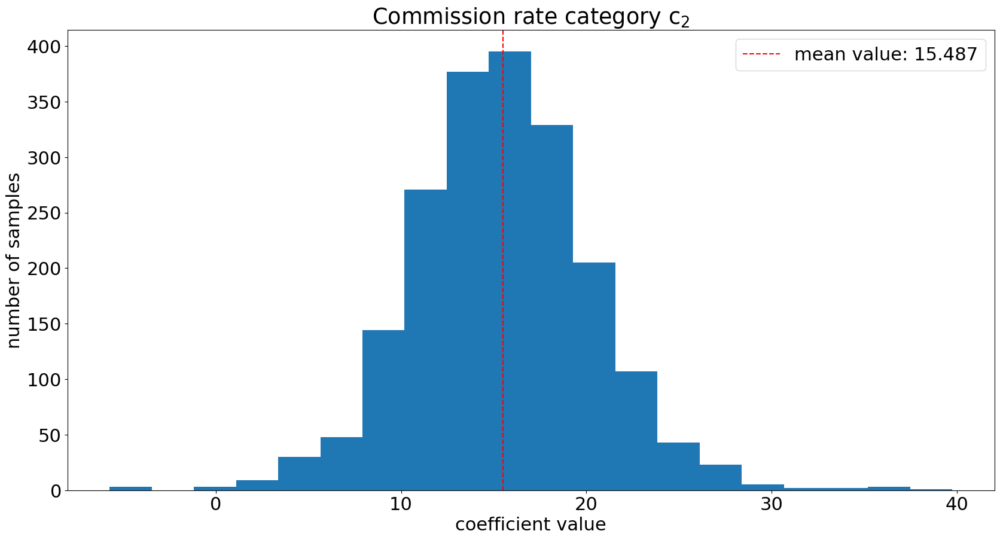

[11.81146485 22.24160704]
1.0


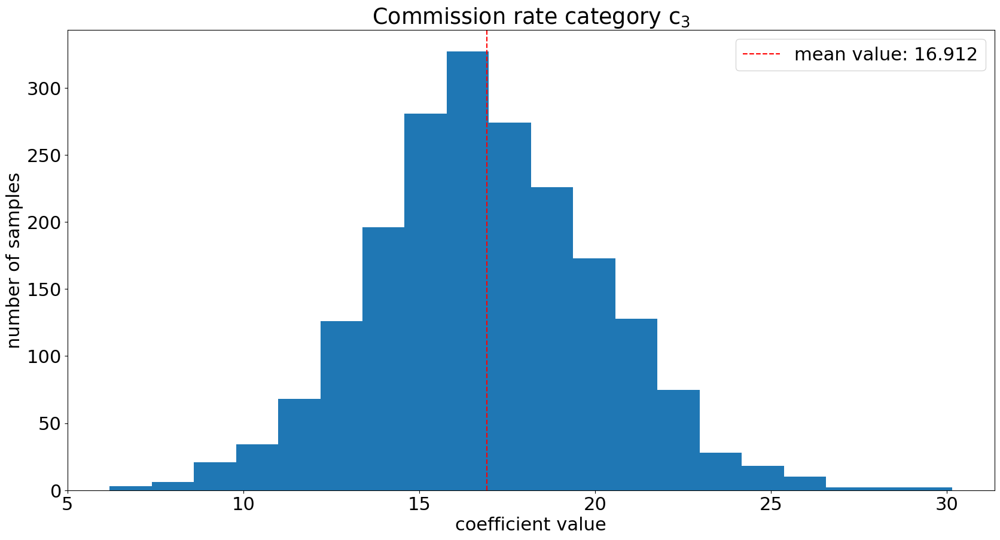

[22.97755308 43.20973856]
1.0


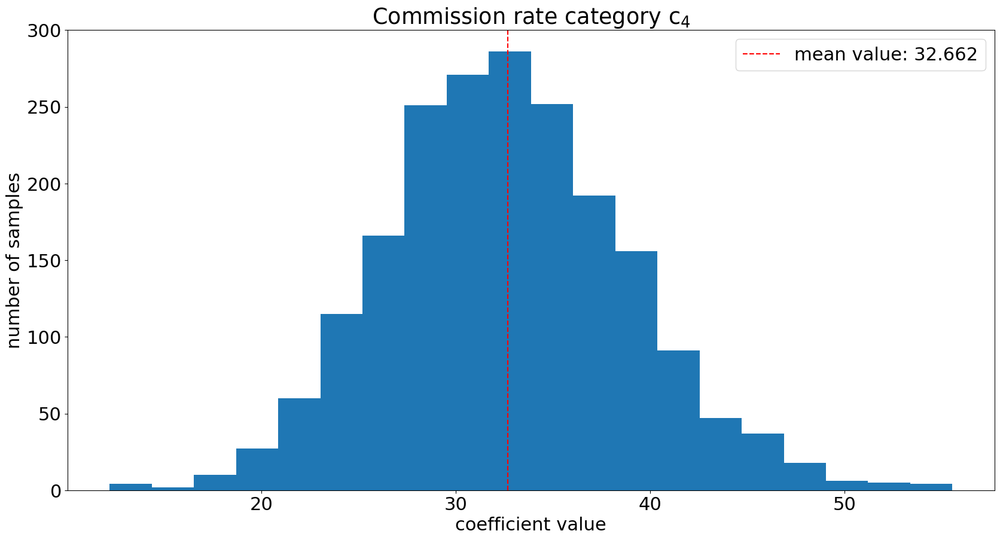

In [35]:
plot_distributions(mu_comm_samples, going_rate_samples)

Calculate 3 pairwise differences:

In [36]:
diff_alpha = 0.05
sample_diffs_21 = mu_comm_samples[:, 2] - mu_comm_samples[:, 1]
print(sample_diffs_21.mean())
print(np.quantile(sample_diffs_21, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

0.012736143634830053
[-0.07486092  0.09899689]


In [37]:
sample_diffs_31 = mu_comm_samples[:, 3] - mu_comm_samples[:, 1]
print(sample_diffs_31.mean())
print(np.quantile(sample_diffs_31, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

0.13840940056691317
[0.02379199 0.25541204]


In [38]:
sample_diffs_32 = mu_comm_samples[:, 3] - mu_comm_samples[:, 2]
print(sample_diffs_32.mean())
print(np.quantile(sample_diffs_32, [diff_alpha / 2, 1 - (diff_alpha / 2)]))

0.12567325693208312
[0.03006883 0.22752227]


In [39]:
b_comm_samples = log_trace['b_comm']
b_comm_samples.shape

(2000, 32, 4)

In [40]:
def calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df, alpha=0.1):
    national_going_rate_samples = mu_comm_samples[:, 0]
    overall_lst = []

    lst = ['national']
    for i in range(3):
        sample_diffs = 100 * (np.exp(mu_comm_samples[:, i + 1] - national_going_rate_samples) - 1)
        mean_diff = np.mean(sample_diffs)
        quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_diff] + list(quantiles) + [(sample_diffs <= 0).mean()])

    overall_lst.append(lst)

    for market_area_index in range(market_area_num):
        market_area = market_area_to_index_df[
            market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
        market_area_samples = b_comm_samples[:, market_area_index, :]
        going_rate_samples = market_area_samples[:, 0]
        lst = [market_area]
        for i in range(1, 4):
            samples = market_area_samples[:, i]
            sample_diffs = 100 * (np.exp(samples - going_rate_samples) - 1)
            mean_diff = np.mean(sample_diffs)
            quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
            lst.extend([mean_diff] + list(quantiles) + [(sample_diffs <= 0).mean()])
        overall_lst.append(lst)

    columns = ['market_area', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 'pvalue2',
               'mean3', 'lower3', 'upper3', 'pvalue3']
    effect_df = pd.DataFrame(overall_lst, columns=columns)
    effect_df['is_national'] = effect_df['market_area'].apply(lambda x: int(x == 'national'))
    return effect_df

In [41]:
effect_df = calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df)

In [42]:
effect_df.head()

,market_area,mean1,lower1,upper1,pvalue1,mean2,lower2,upper2,pvalue2,mean3,lower3,upper3,pvalue3,is_national
0,national,15.487399,8.143894,23.285118,0.0020,16.912182,11.811465,22.241607,0.000,32.661998,22.977553,43.209739,0.0000,1
1,Atlanta,21.435600,16.899347,25.981031,0.0000,64.498904,53.694250,75.176475,0.000,-13.636728,-32.562847,9.831578,0.8535,0
2,Austin,37.636845,30.269104,45.628941,0.0000,34.949365,21.615781,49.372899,0.000,79.026010,38.022482,133.107742,0.0000,0
3,Boston,17.780064,-6.882476,46.568235,0.1090,18.565491,-2.384760,42.743596,0.071,39.933034,22.017223,60.333801,0.0000,0
4,Buffalo,0.958822,-8.836160,11.242648,0.4405,5.229467,-12.752853,24.004167,0.320,33.593162,-3.877142,81.355432,0.0660,0


In [43]:
for i in range(1, 4):
    show_df = effect_df[effect_df['market_area'].isin(
        final_df_f[final_df_f['buyside_commission_range'] == i]['market_area'].unique())][
        ['market_area'] + [col for col in effect_df.columns if col.endswith(str(i))]]
    
    show_df.sort_values('market_area', inplace=True)
    
    def get_interval(row):
        lower = round(row[f'lower{i}'], 1)
        upper = round(row[f'upper{i}'], 1)
        return f'[{lower}%; {upper}%]'  
    
    show_df['90% interval'] = show_df.apply(get_interval, axis=1)
    show_df.drop(columns=[f'lower{i}', f'upper{i}'], inplace=True)
    show_df[f'mean{i}'] = show_df[f'mean{i}'].round(1)
    show_df[f'mean{i}'] = show_df[f'mean{i}'].apply(lambda x: f'{x}%')
    show_df['prob_above_zero'] = (100 * (1 - show_df[f'pvalue{i}'])).round(1)
    show_df['prob_above_zero'] = show_df['prob_above_zero'].apply(lambda x: f'{x}%')
    show_df = show_df[['market_area', f'mean{i}', '90% interval', 'prob_above_zero']]
    print(len(show_df))
    display(show_df)

12


,market_area,mean1,90% interval,prob_above_zero
1,Atlanta,21.4%,[16.9%; 26.0%],100.0%
2,Austin,37.6%,[30.3%; 45.6%],100.0%
4,Buffalo,1.0%,[-8.8%; 11.2%],56.0%
8,Columbus,1.1%,[-11.9%; 13.6%],55.2%
10,Dallas,15.5%,[11.3%; 19.4%],100.0%
11,Denver,11.0%,[7.0%; 15.3%],100.0%
14,Houston,18.9%,[13.9%; 23.8%],100.0%
15,Indianapolis,12.2%,[4.5%; 19.9%],99.4%
17,Kansas City,26.1%,[15.0%; 37.5%],100.0%
24,"Portland, OR",9.4%,[4.5%; 14.4%],100.0%


27


,market_area,mean2,90% interval,prob_above_zero
1,Atlanta,64.5%,[53.7%; 75.2%],100.0%
2,Austin,34.9%,[21.6%; 49.4%],100.0%
4,Buffalo,5.2%,[-12.8%; 24.0%],68.0%
5,Camden,1.6%,[-4.2%; 7.5%],65.8%
6,Chicago,12.3%,[8.4%; 16.4%],100.0%
7,Cleveland,15.0%,[2.7%; 28.4%],98.2%
8,Columbus,14.7%,[-0.2%; 31.7%],94.6%
9,DC metro area,16.2%,[11.4%; 20.8%],100.0%
10,Dallas,25.6%,[18.3%; 33.0%],100.0%
11,Denver,21.8%,[10.4%; 34.2%],100.0%


32


,market_area,mean3,90% interval,prob_above_zero
1,Atlanta,-13.6%,[-32.6%; 9.8%],14.6%
2,Austin,79.0%,[38.0%; 133.1%],100.0%
3,Boston,39.9%,[22.0%; 60.3%],100.0%
4,Buffalo,33.6%,[-3.9%; 81.4%],93.4%
5,Camden,31.1%,[8.9%; 57.8%],99.1%
6,Chicago,34.2%,[11.3%; 59.2%],99.7%
7,Cleveland,22.5%,[-3.3%; 50.9%],92.2%
8,Columbus,47.4%,[12.4%; 100.0%],99.1%
9,DC metro area,39.2%,[20.2%; 59.0%],100.0%
10,Dallas,48.0%,[25.0%; 75.3%],100.0%


In [44]:
c0_dom_df = stats_df[stats_df['buyside_commission_range'] == 0]
market_area_to_c0_dom = dict(zip(c0_dom_df['market_area'], c0_dom_df['mean_dom']))

In [45]:
def plot_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    just_under_market_areas = ['national'] + just_under_market_areas

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    above_2_market_areas = ['national'] + above_2_market_areas

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(['is_national', f'lower{i}'], ascending=[False, False], inplace=True)
        
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'lower{i}'] > 0
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=0, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            if market_area == 'national':
                num_listings = len(final_df_f[final_df_f['buyside_commission_range'] == i])
                yticks.append(f'{market_area} (N={num_listings})')
            else:
                num_listings = len(final_df_f[(final_df_f['buyside_commission_range'] == i) &
                                              (final_df_f['market_area'] == market_area)])
                c0_dom = market_area_to_c0_dom[market_area]
                yticks.append(f'{market_area} (N={num_listings}, $DOM_{{c_1}}$={round(c0_dom)})')
        
        plt.yticks(y, yticks)
        plt.xlabel('percent difference in days on market relative to listings offering going rate commission')
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        
        plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()]) 
        plt.show()

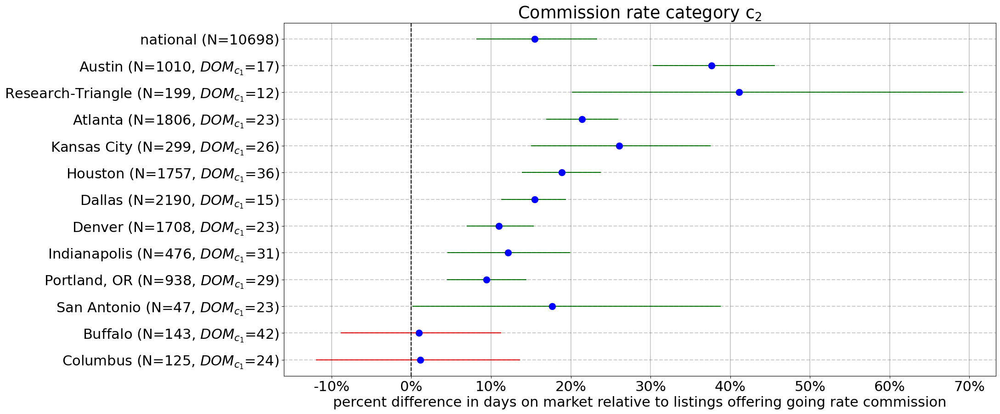

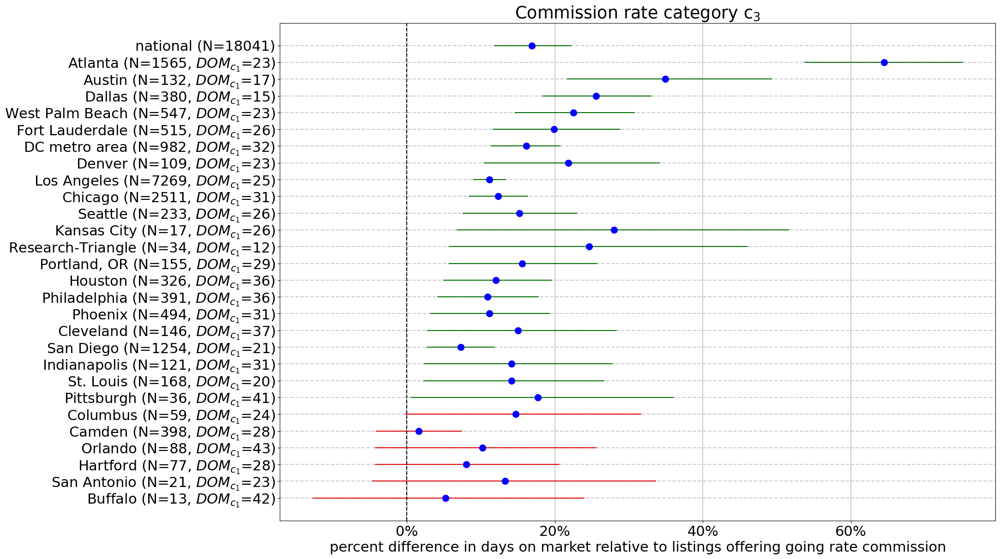

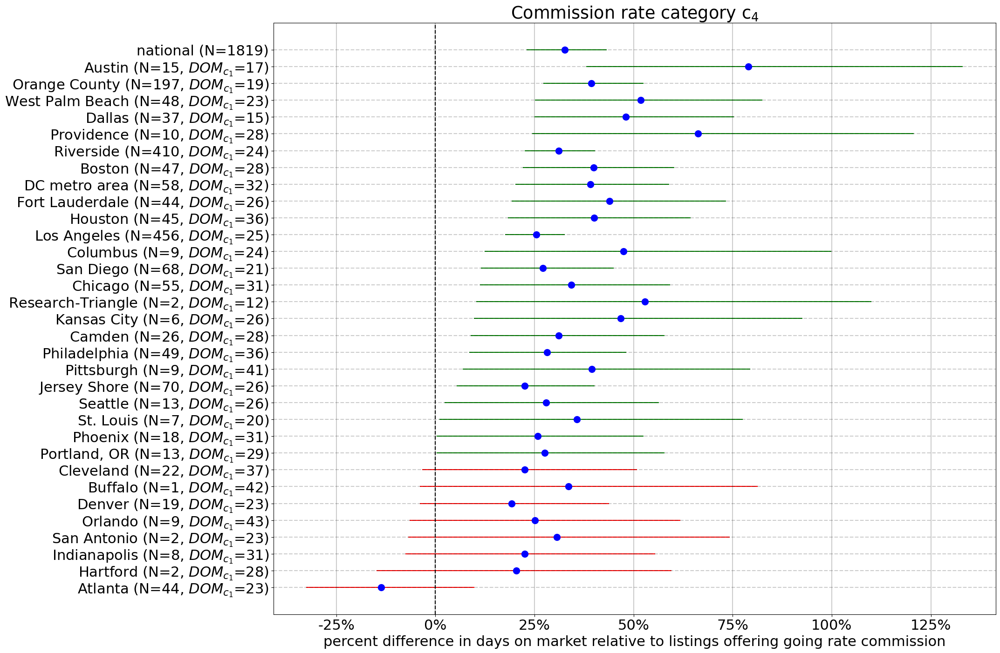

In [46]:
plot_effects(effect_df)

In [47]:
def plot_national_effects(effect_df):
    national_row = effect_df[effect_df['market_area'] == 'national']
    
    plt.figure(figsize=(20, 10))
    for i in range(1, 4):
        y = 4 - i
        x = national_row[f'mean{i}']
        xerr = (np.abs(national_row[[f'lower{i}', f'upper{i}']].to_numpy() -
                       national_row[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = (national_row[f'lower{i}'] > 0).iloc[0]
        color = 'g' if is_significant else 'r'
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=color, capsize=0, marker='o', markersize=10, 
                     ls='none')
    plt.axvline(x=0, linestyle='--', color='k')
    plt.xlabel('percent difference in days on market relative to listings offering going rate commission')
    xticks = plt.xticks()[0]
    first = 1 if i != 3 else 1
    for xtick in xticks[first: -1]:
        plt.axvline(x=xtick, color='k', linestyle='--', alpha=0.2)
        
    plt.ylabel('commission rate category')
    plt.yticks([1, 2, 3], ['$\mathregular{c_4}$', '$\mathregular{c_3}$', '$\mathregular{c_2}$'])
    plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()]) 
    plt.show()

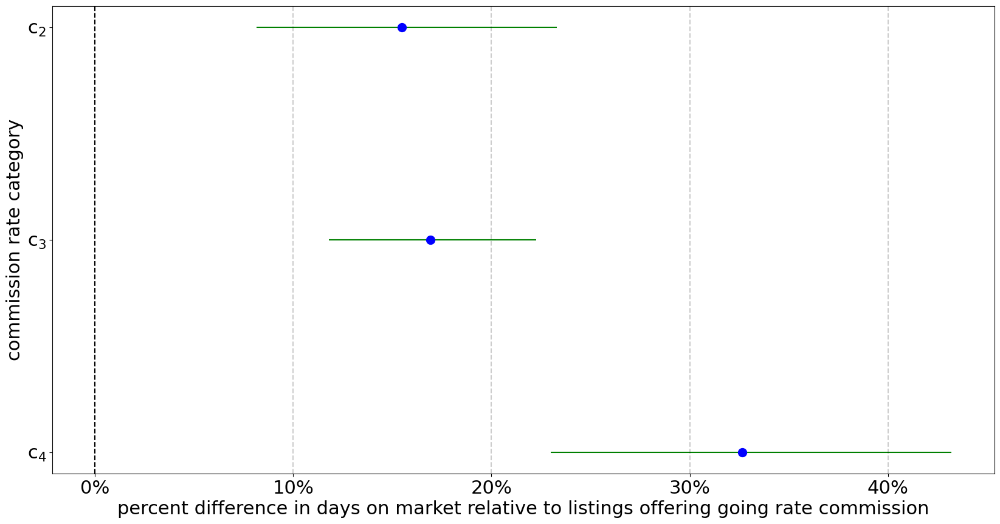

In [48]:
plot_national_effects(effect_df)

## DOM for iBuyers

In [49]:
def calculate_summary_statistics_ibuyer(ibuyer_name, market_area_to_index_df, alpha=0.1, min_sales=40):
    b_ibuyer_samples = log_trace[f'b_{ibuyer_name}']
    overall_lst = []

    for market_area_index in range(market_area_num):
        market_area = market_area_to_index_df[
            market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
        n_ibuyer_listings = final_df_f[final_df_f['market_area'] == market_area][ibuyer_name].sum()
        if n_ibuyer_listings < min_sales:
            continue
        market_area_samples = b_ibuyer_samples[:, market_area_index]
        market_area_samples = 100 * (np.exp(market_area_samples) - 1)
        lst = [market_area]
        mean_sample = np.mean(market_area_samples)
        quantiles = np.quantile(market_area_samples, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_sample, n_ibuyer_listings] + list(quantiles) + [(market_area_samples <= 0).mean()])
        overall_lst.append(lst)

    columns = ['market_area', 'mean', 'n', 'lower', 'upper', 'pvalue']
    effect_df = pd.DataFrame(overall_lst, columns=columns)
    return effect_df

def plot_effects_ibuyer(ibuyer_name, effect_df):
    ibuyer_name = ibuyer_name.capitalize()
    df = effect_df.copy()
    df.sort_values('lower', ascending=False, inplace=True)

    plt.figure(figsize=(20, max(10, len(df) / 2)))
    y = [x for x in range(len(df), 0, -1)]
    x = df['mean']
    xerr = (np.abs(df[['lower', 'upper']].to_numpy() -
                   df['mean'].to_numpy().reshape(-1, 1)).T)
    is_significant = df['lower'] > 0
    colors = ['g' if x else 'r' for x in is_significant]
    plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                 ls='none')
    plt.axvline(x=0, linestyle='--', color='k')

    yticks = []
    for market_area in df['market_area']:
        market_area_df = df[df['market_area'] == market_area]
        
        num_listings = market_area_df['n'].iloc[0]
        p_value = market_area_df['pvalue'].iloc[0]

        prob_above_zero = 100 * (1 - p_value)
        yticks.append(f'{market_area} (N={num_listings}, p={round(prob_above_zero)}%)')

    plt.yticks(y, yticks)
    plt.xlabel(
        f'percent difference in mean days on market for {ibuyer_name} listings relative to non-iBuyer listings')
    xticks = plt.xticks()[0]
    for xtick in xticks[1: -1]:
        plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)

    yticks = plt.yticks()[0]
    for ytick in yticks:
        plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
    plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()]) 
    plt.title(ibuyer_name)
    plt.show()

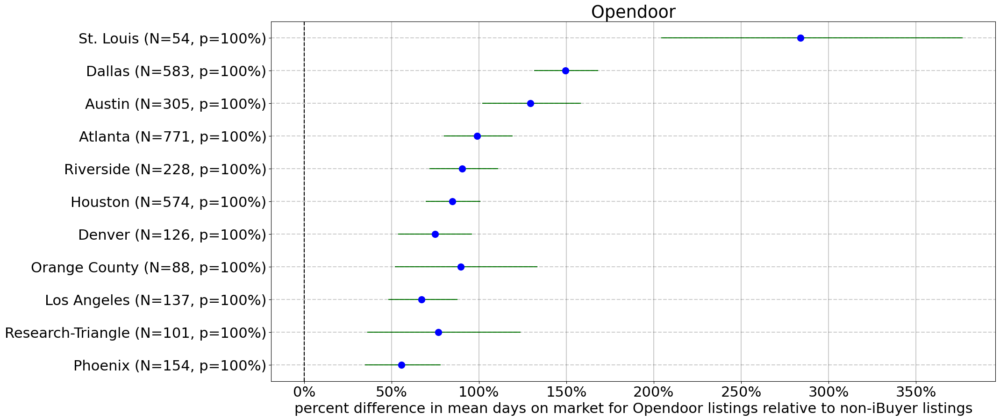

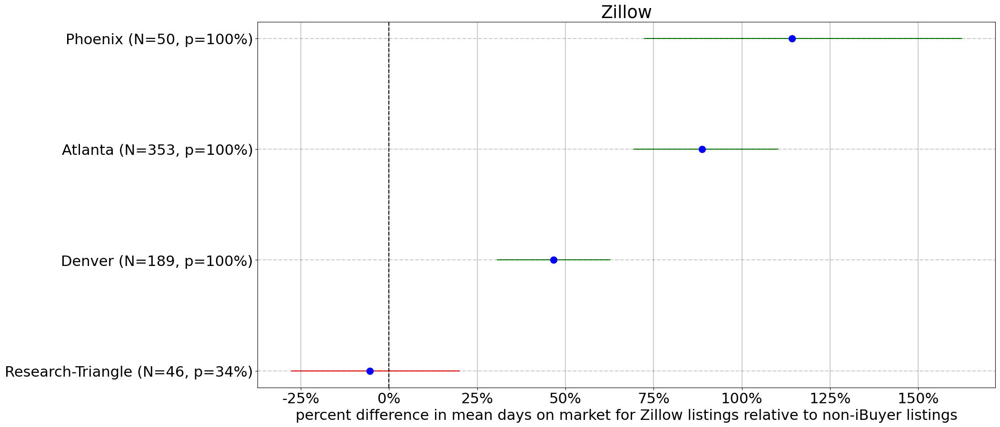

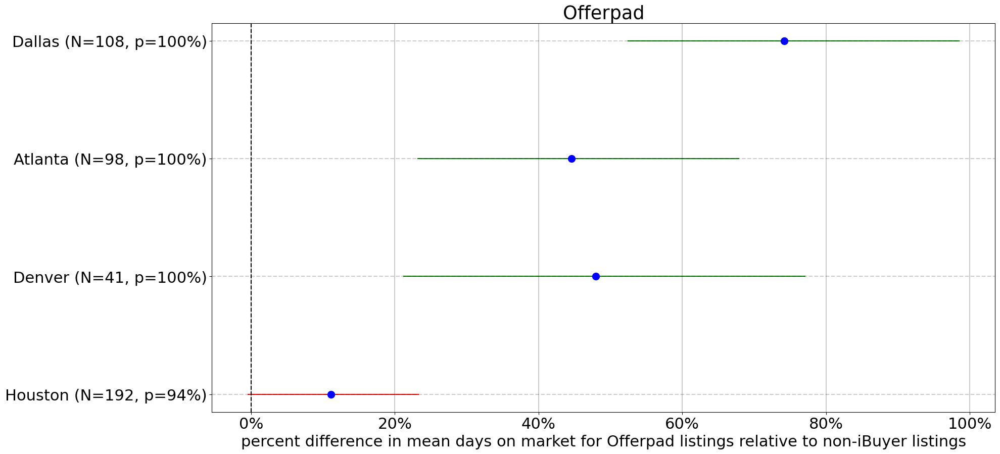

In [50]:
for ibuyer_name in ['opendoor', 'zillow', 'offerpad']:
    effect_df_ibuyer = calculate_summary_statistics_ibuyer(ibuyer_name, market_area_to_index_df)
    plot_effects_ibuyer(ibuyer_name, effect_df_ibuyer)

## explore results

In [51]:
def plot_effect_of_variables(variable, 
                             x_label=None, 
                             y_label='Percent difference in DOM relative to listings in lowest decile', 
                             alpha=0.05):

    b_samples_mat = log_trace[variable]
    
    for _, row in market_area_to_index_df.iterrows():
        market_area = row['market_area']
        market_area_index = row['market_area_index']
        b_samples = b_samples_mat[:, market_area_index, :]
        range_vals = b_samples.shape[1]

        null_frac = final_df_f[
            final_df_f['market_area'] == market_area]['null_redfin_price_estimate'].mean()
        
        if variable == 'b_price_difference_pct':
            print('fraction of homes with null Redfin price estimate:', round(null_frac, 3))
            
        plt.figure(figsize=(20, 10))
        x_vals = []
        y_vals = []
        y_err = np.zeros((2, range_vals - 1))
        for i in range(range_vals - 1):
            samples = 100 * (np.exp(b_samples[:, i + 1] - b_samples[:, 0]) - 1)
            x_vals.append(i + 2)
            sample_mean = np.mean(samples)
            y_vals.append(sample_mean)
            quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
            errors = np.abs(quantiles - sample_mean)
            y_err[:, i] = errors

        plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(market_area)

        yticks = plt.yticks()[0]
        for ytick in yticks[1: -1]:
                plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.gca().set_yticklabels([f'{y/100:.0%}' for y in plt.gca().get_yticks()]) 
        plt.show()

fraction of homes with null Redfin price estimate: 0.053


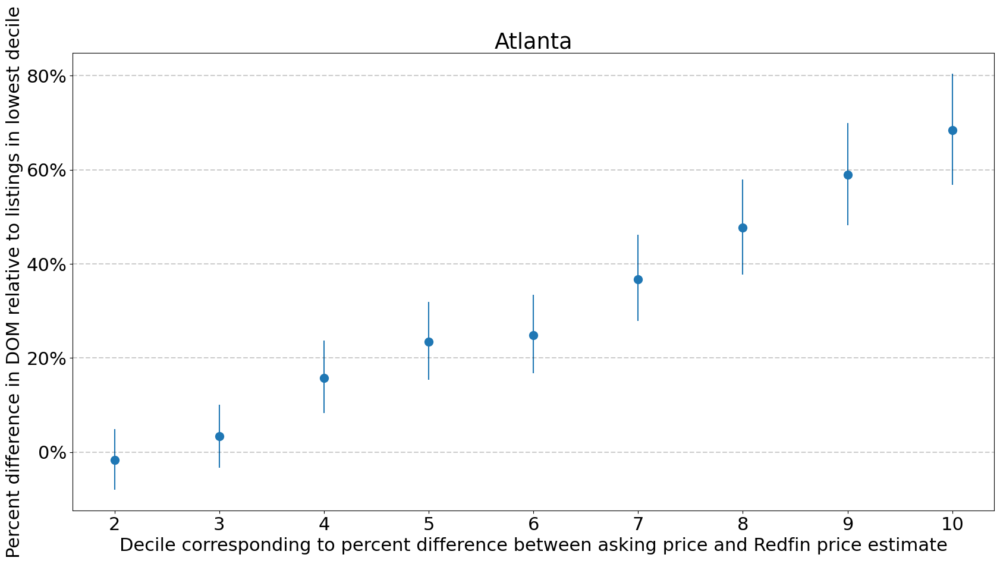

fraction of homes with null Redfin price estimate: 0.747


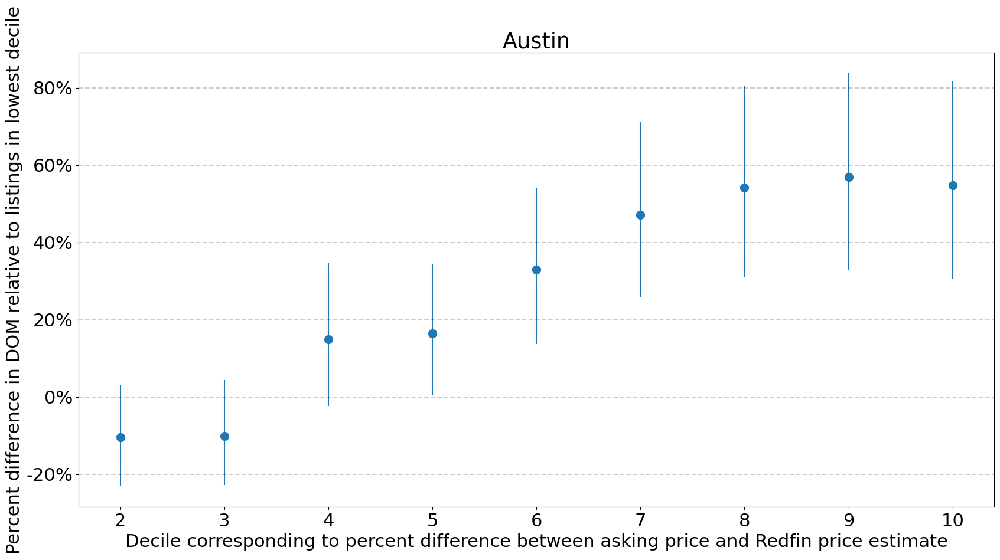

fraction of homes with null Redfin price estimate: 0.049


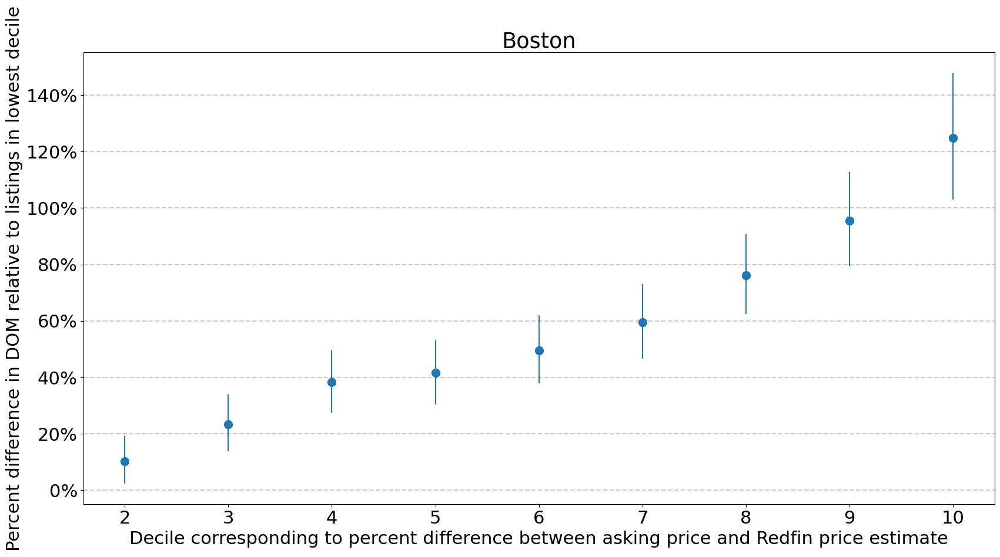

fraction of homes with null Redfin price estimate: 0.303


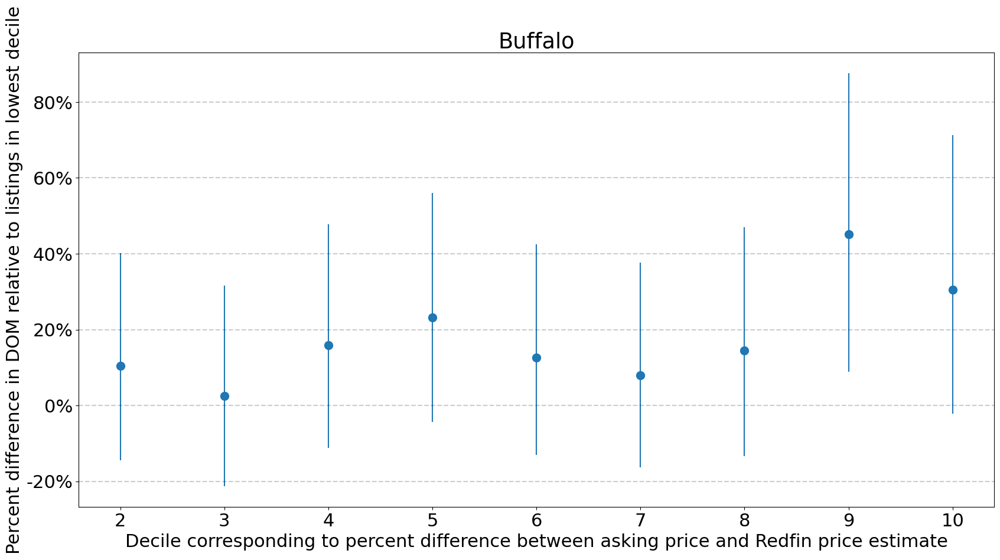

fraction of homes with null Redfin price estimate: 0.205


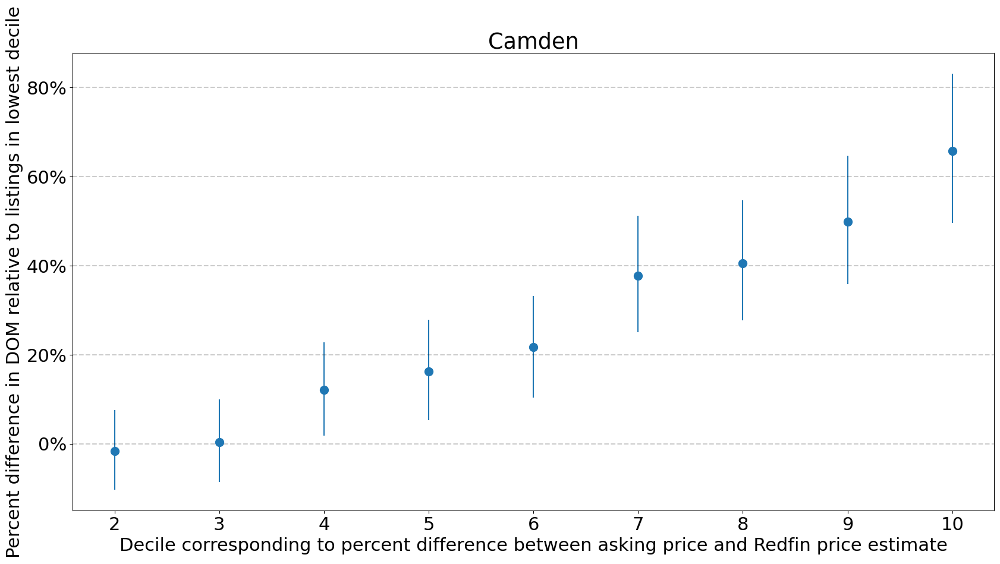

fraction of homes with null Redfin price estimate: 0.725


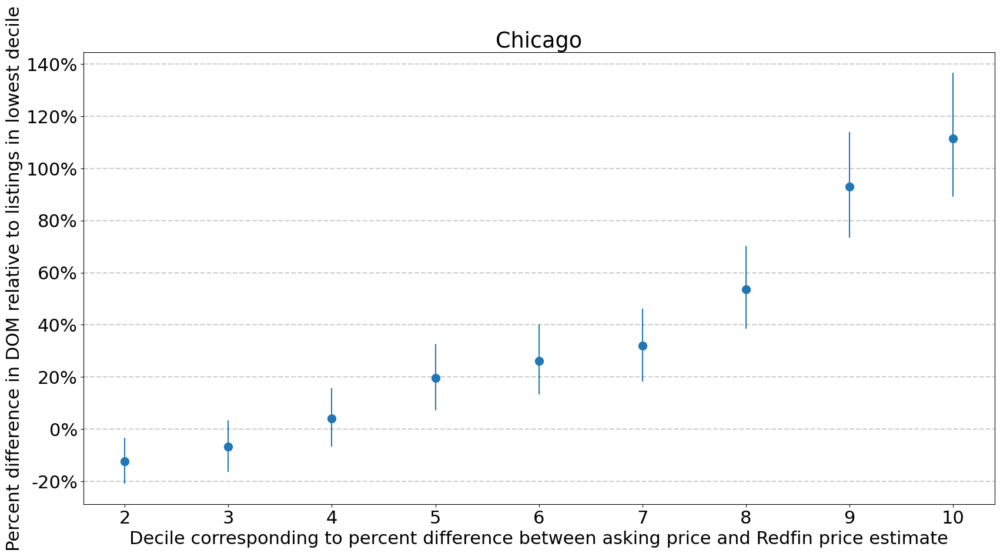

fraction of homes with null Redfin price estimate: 0.006


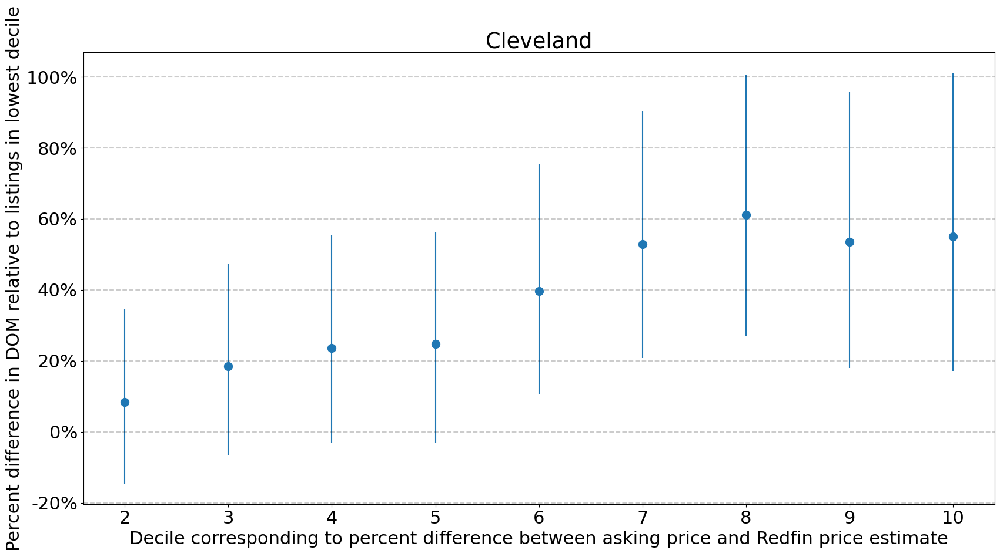

fraction of homes with null Redfin price estimate: 0.914


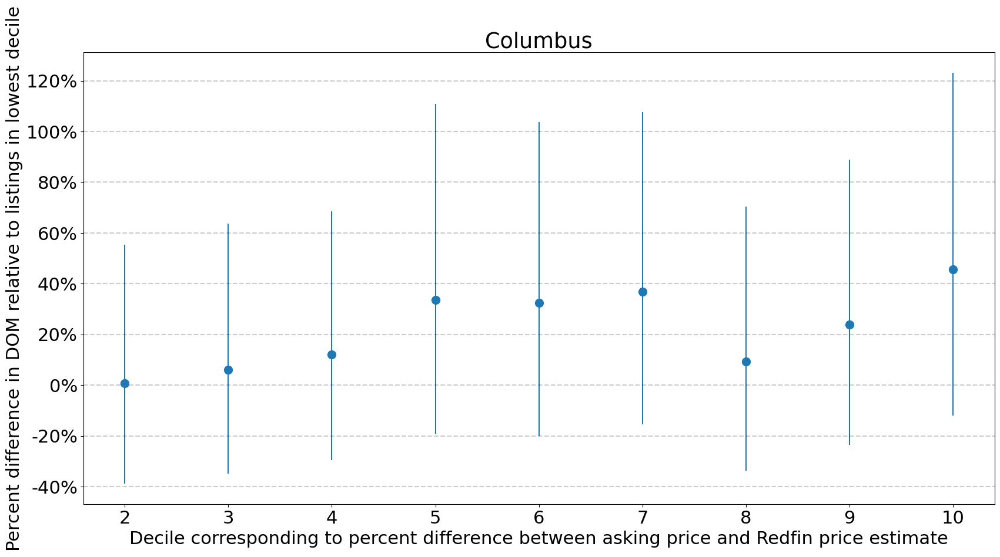

fraction of homes with null Redfin price estimate: 0.183


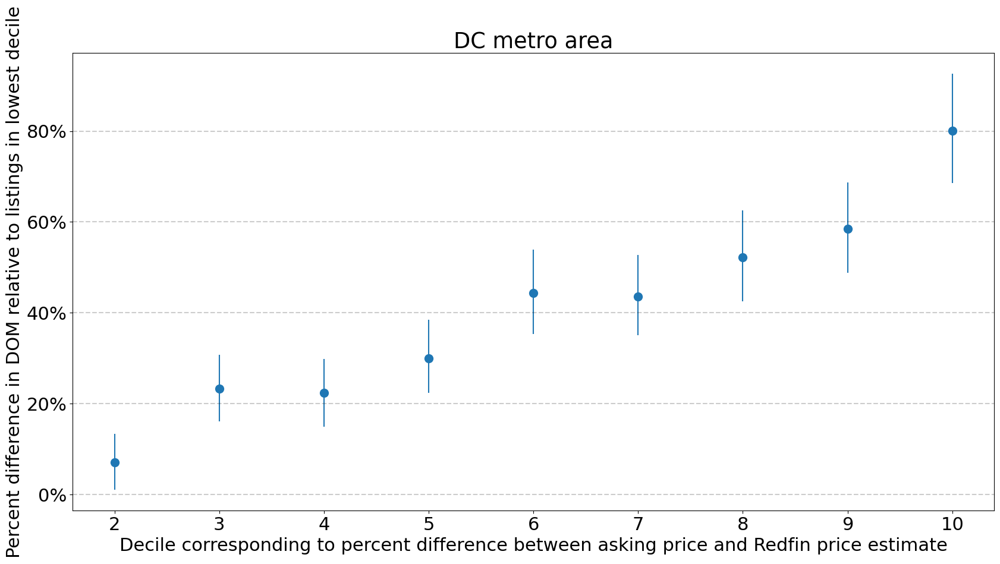

fraction of homes with null Redfin price estimate: 0.305


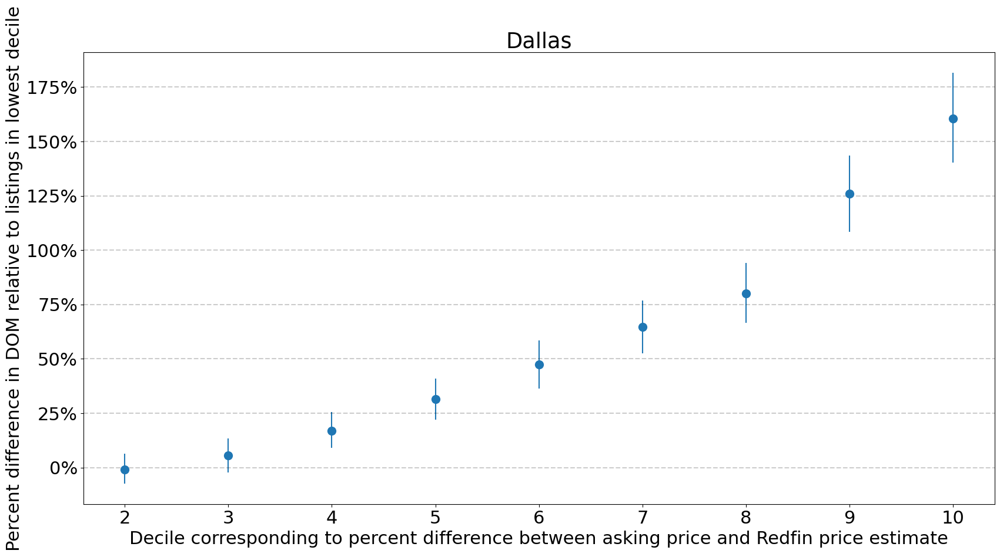

fraction of homes with null Redfin price estimate: 0.15


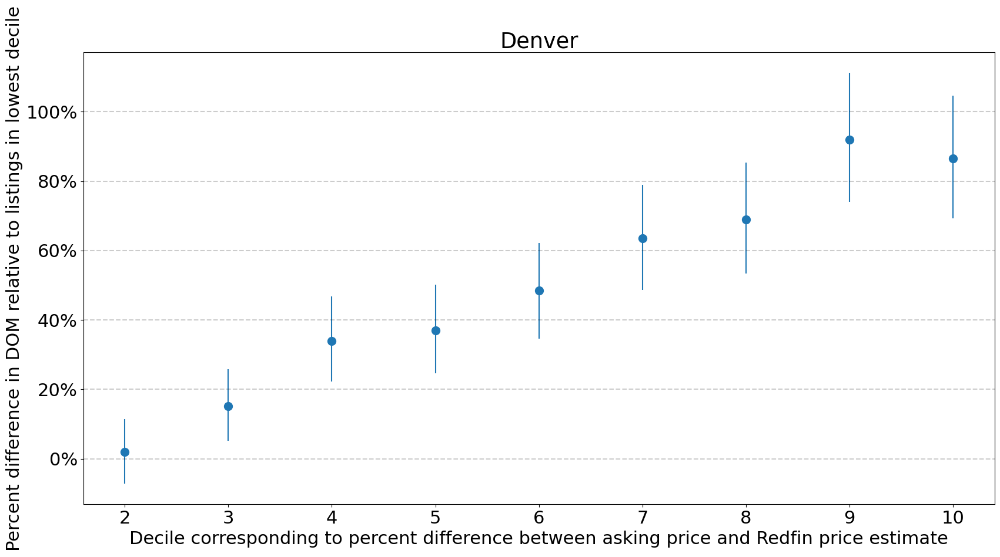

fraction of homes with null Redfin price estimate: 0.233


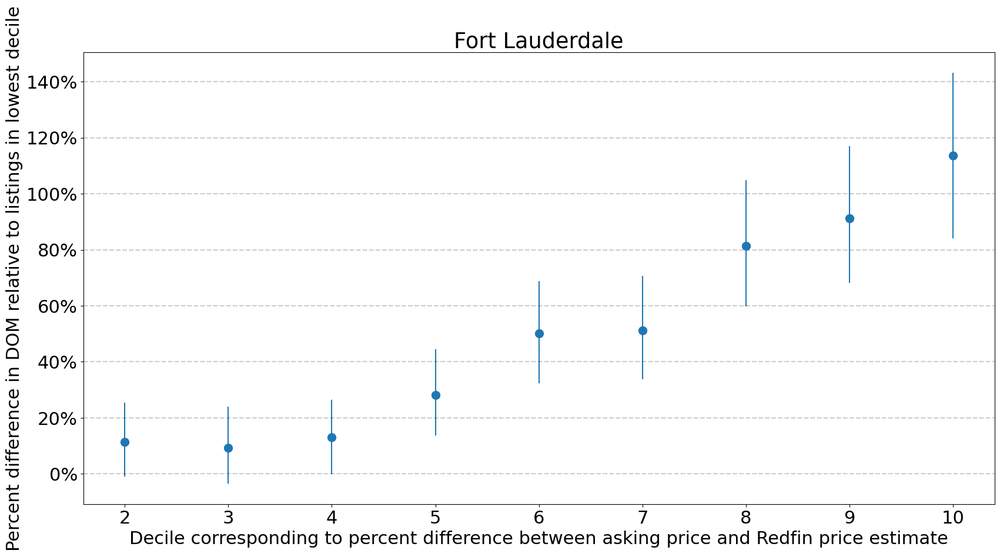

fraction of homes with null Redfin price estimate: 0.36


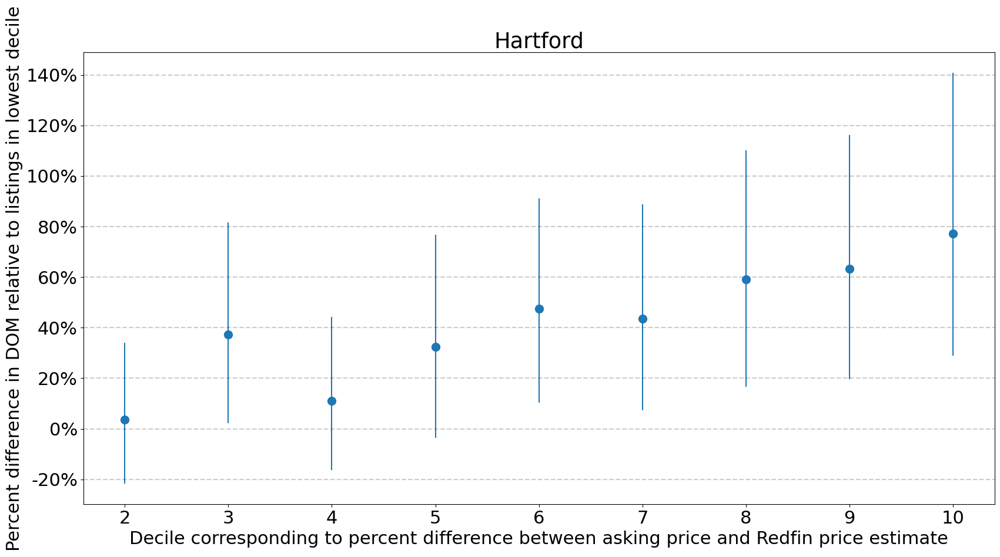

fraction of homes with null Redfin price estimate: 0.05


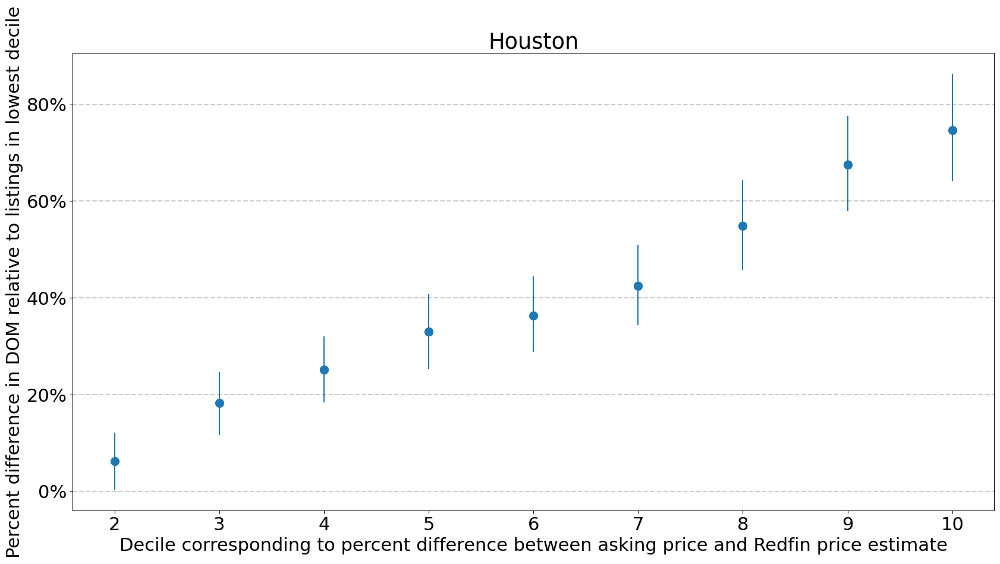

fraction of homes with null Redfin price estimate: 0.743


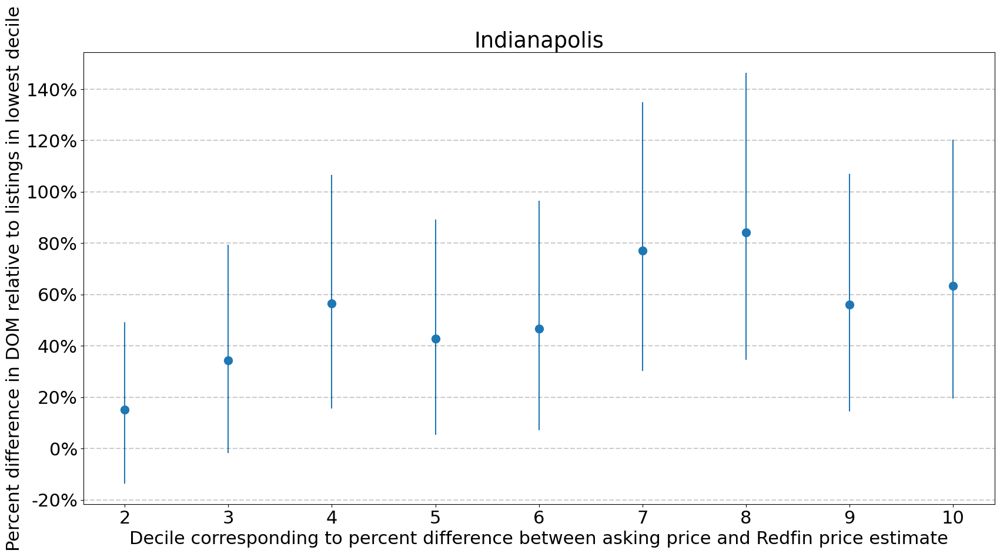

fraction of homes with null Redfin price estimate: 0.207


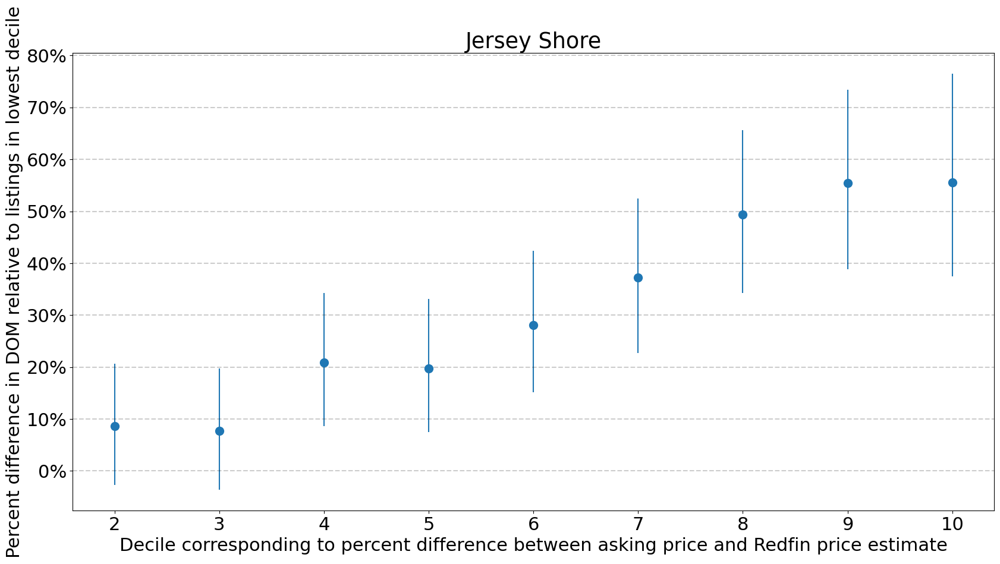

fraction of homes with null Redfin price estimate: 0.966


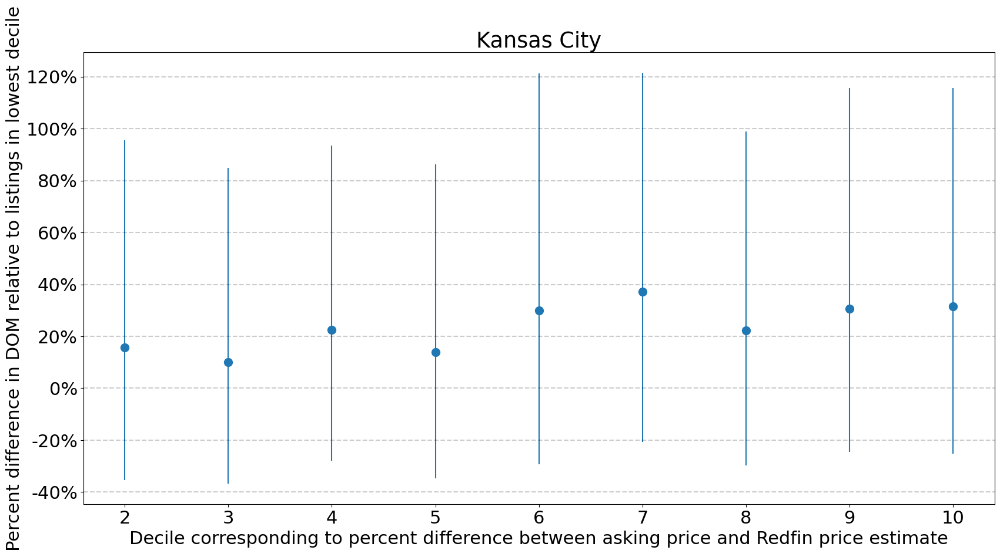

fraction of homes with null Redfin price estimate: 0.158


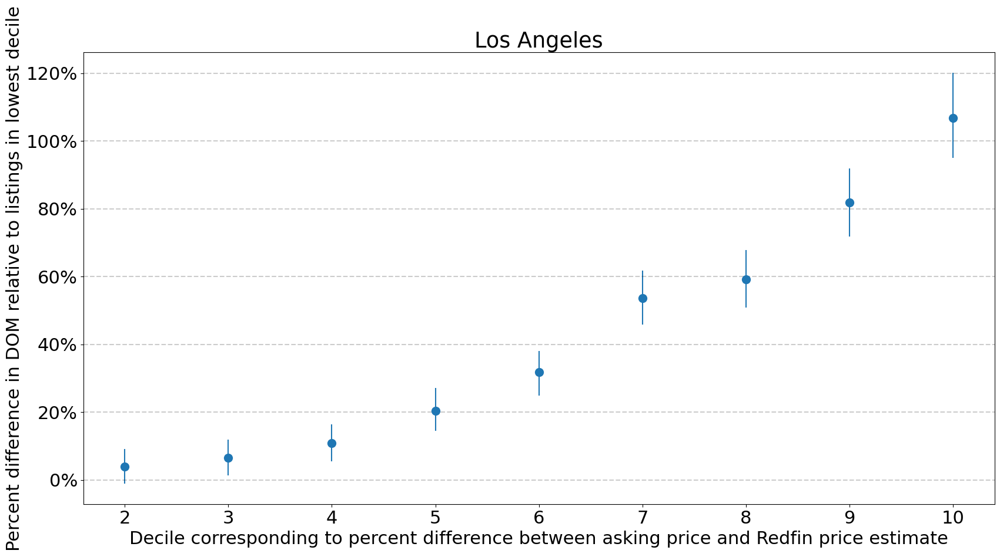

fraction of homes with null Redfin price estimate: 0.243


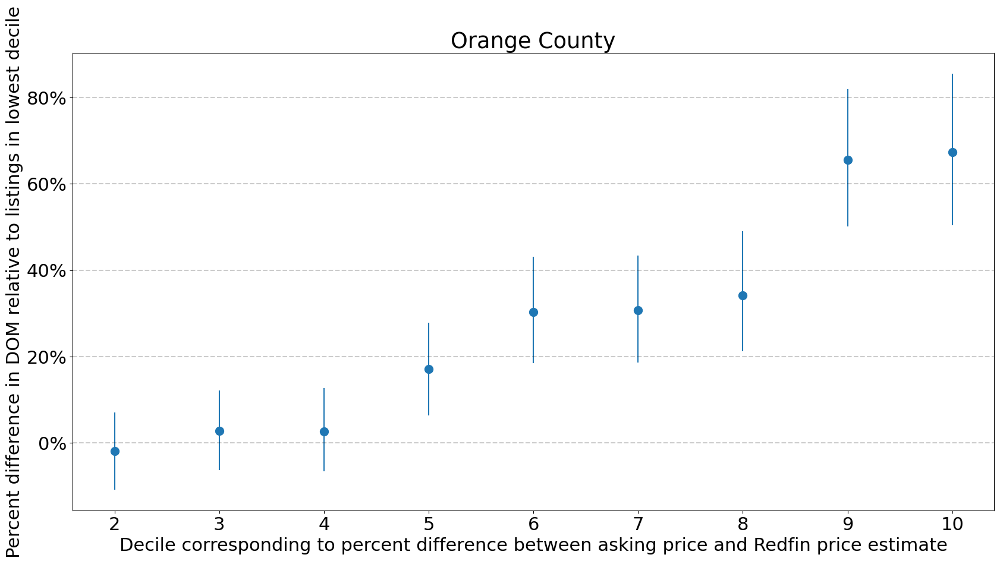

fraction of homes with null Redfin price estimate: 0.347


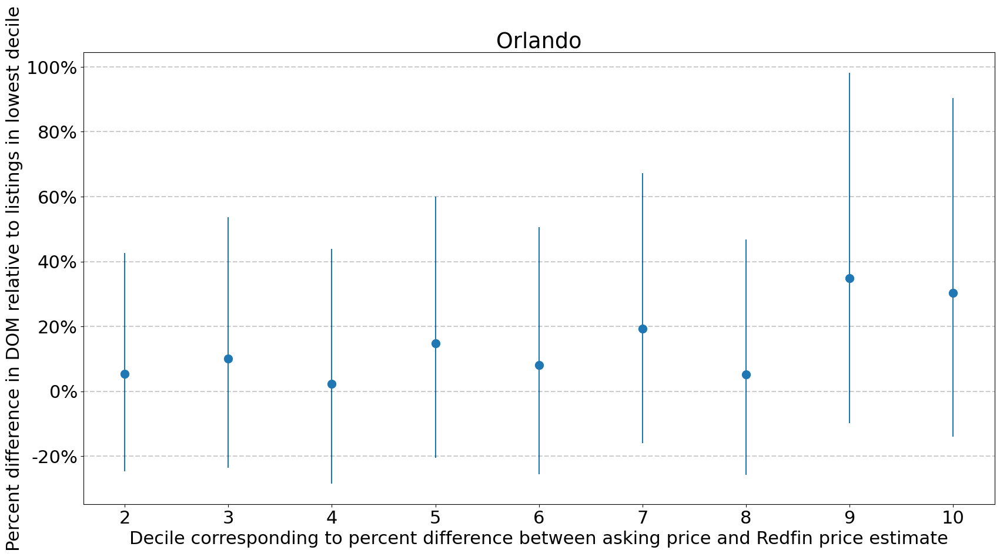

fraction of homes with null Redfin price estimate: 0.137


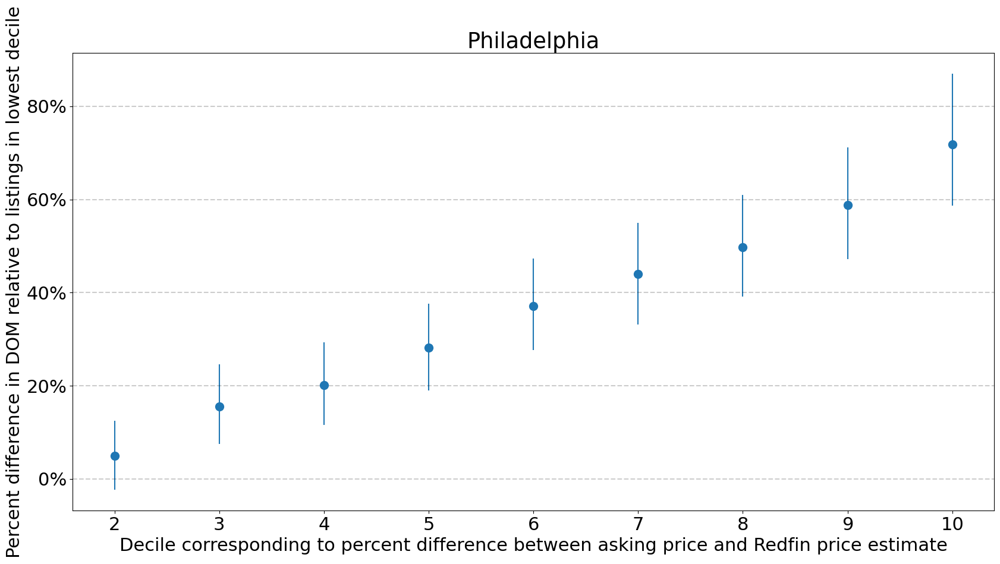

fraction of homes with null Redfin price estimate: 0.956


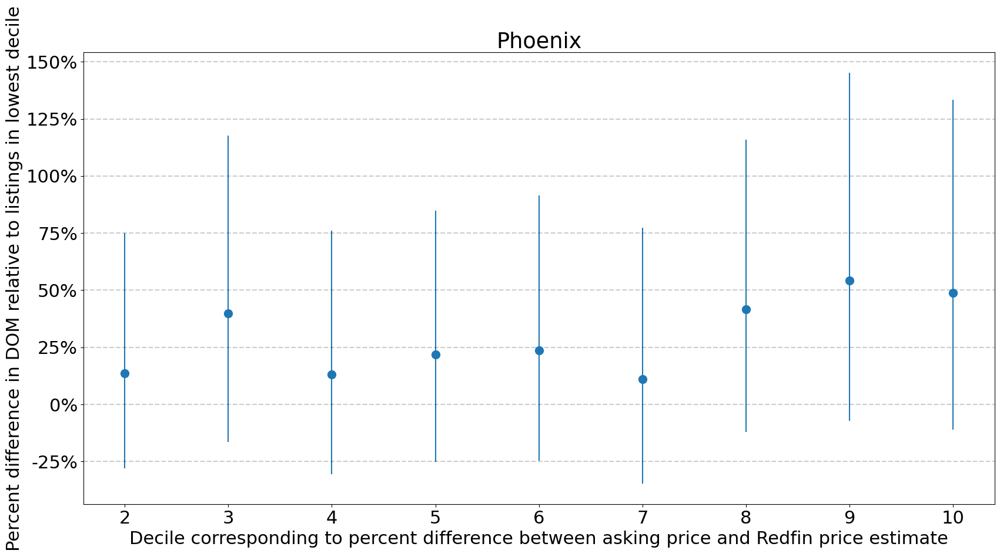

fraction of homes with null Redfin price estimate: 0.004


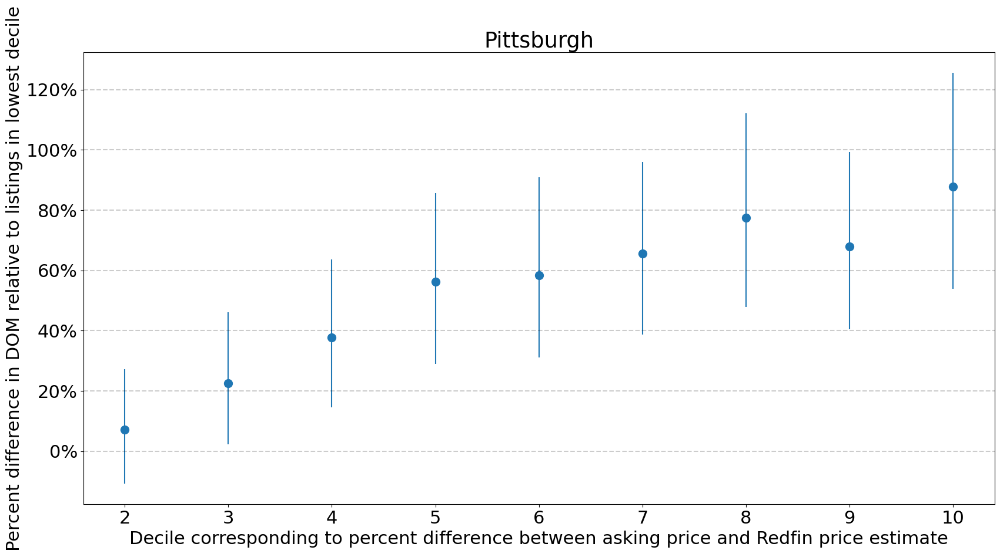

fraction of homes with null Redfin price estimate: 0.264


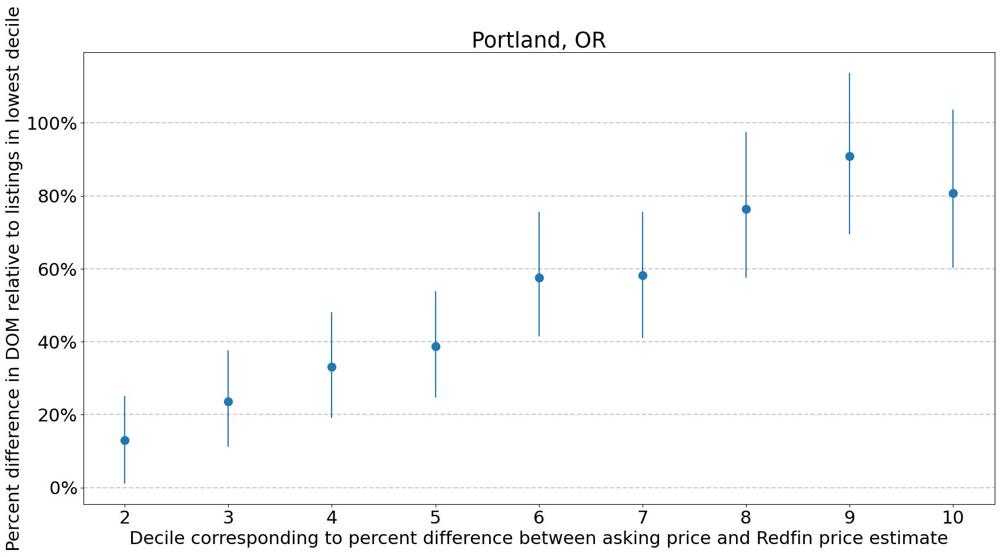

fraction of homes with null Redfin price estimate: 0.331


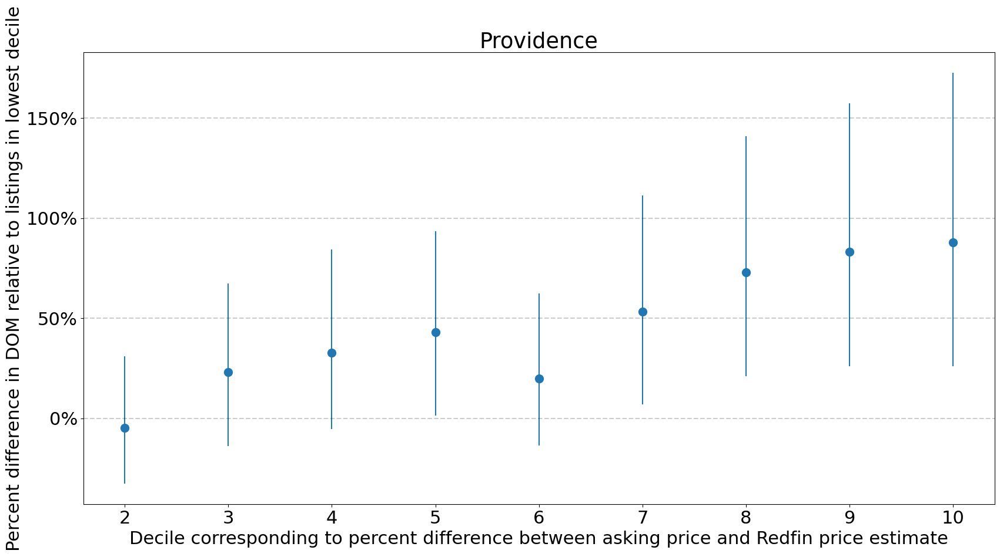

fraction of homes with null Redfin price estimate: 0.456


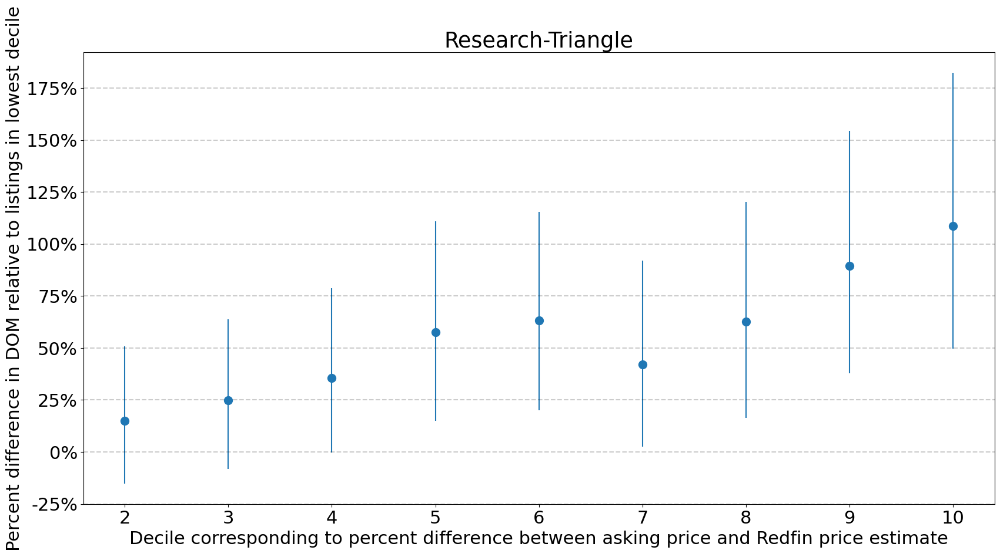

fraction of homes with null Redfin price estimate: 0.225


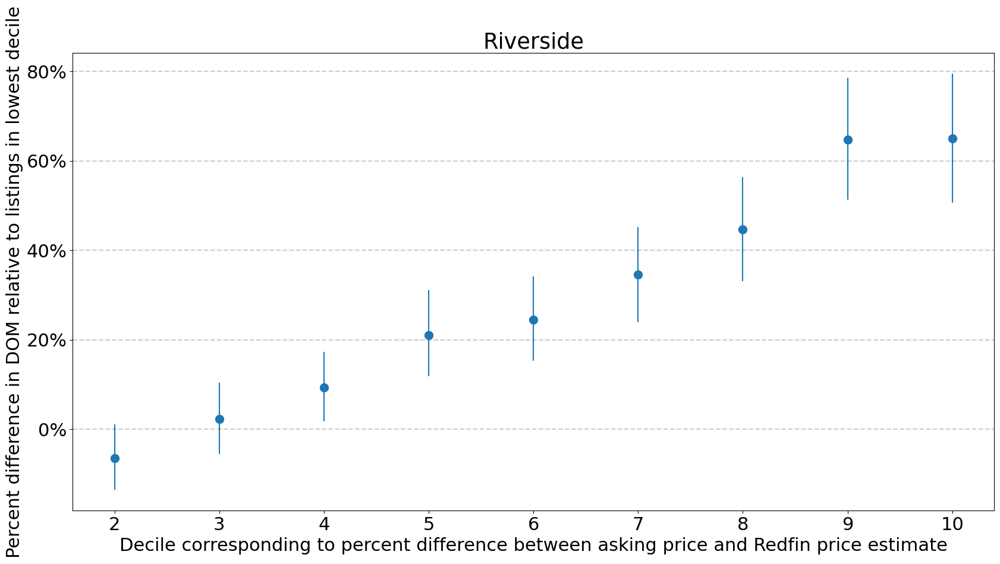

fraction of homes with null Redfin price estimate: 0.669


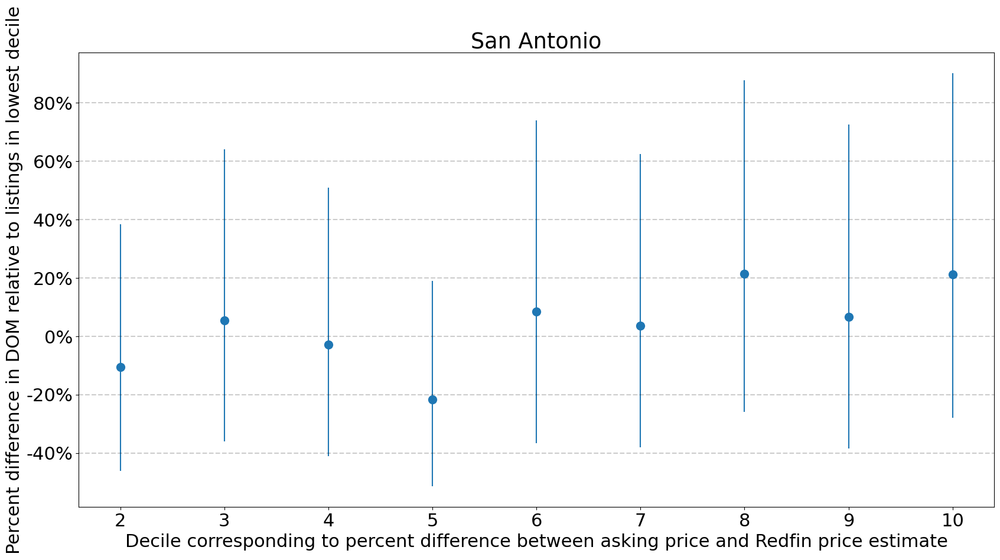

fraction of homes with null Redfin price estimate: 0.267


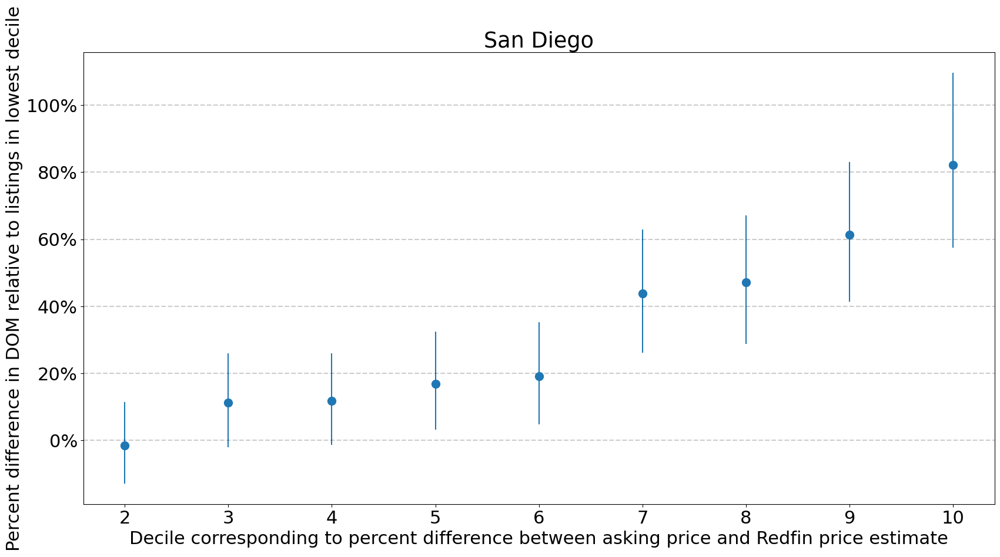

fraction of homes with null Redfin price estimate: 0.154


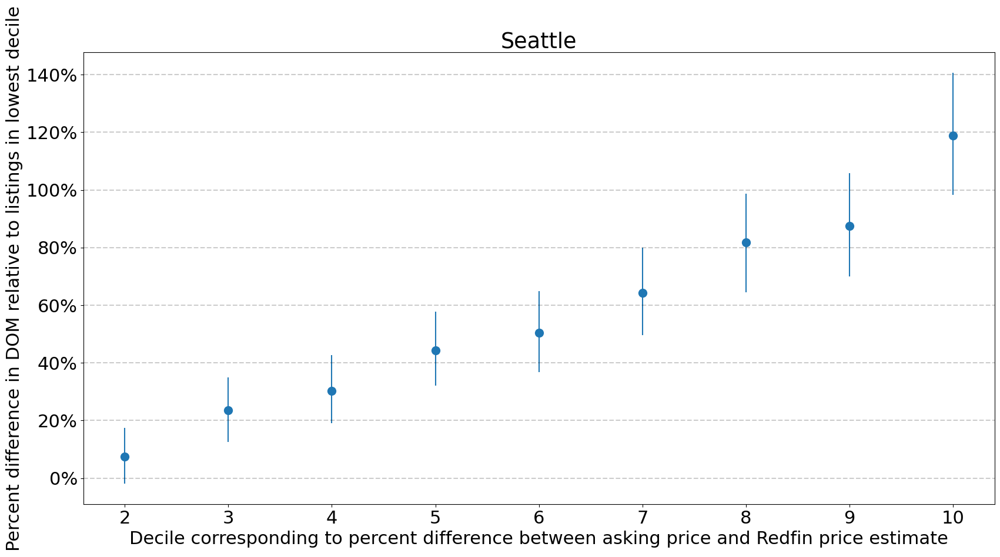

fraction of homes with null Redfin price estimate: 0.358


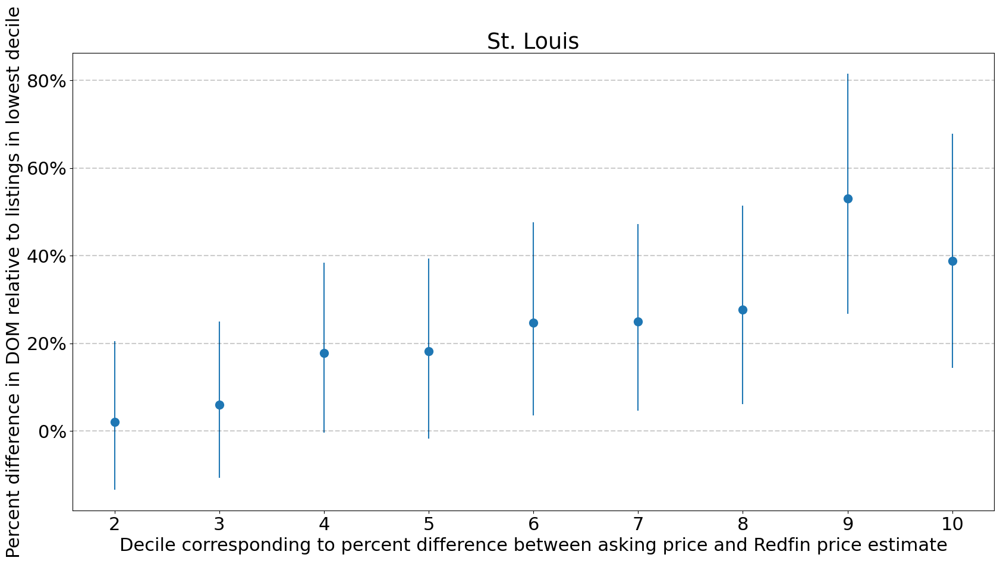

fraction of homes with null Redfin price estimate: 0.177


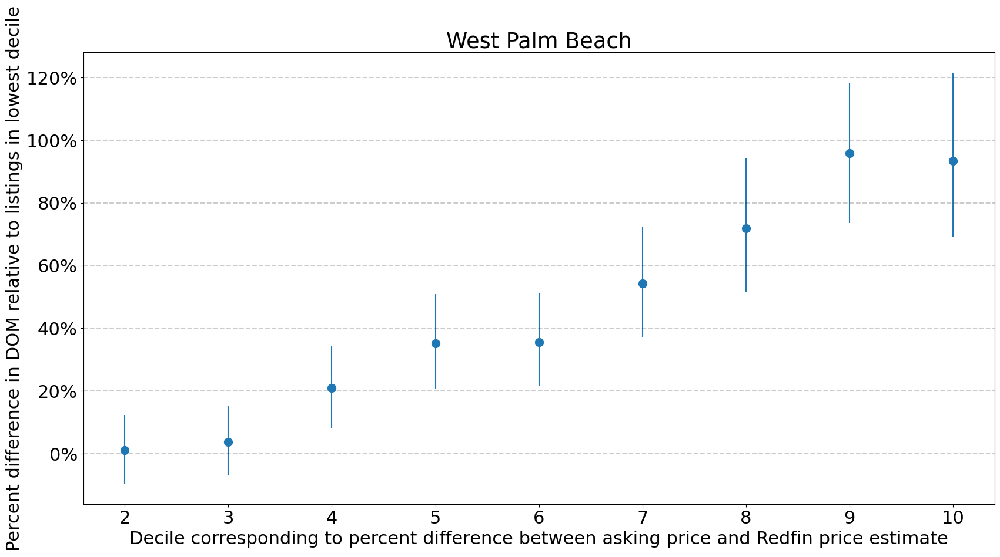

In [52]:
plot_effect_of_variables(
    'b_price_difference_pct', 
    x_label='Decile corresponding to percent difference between asking price and Redfin price estimate')

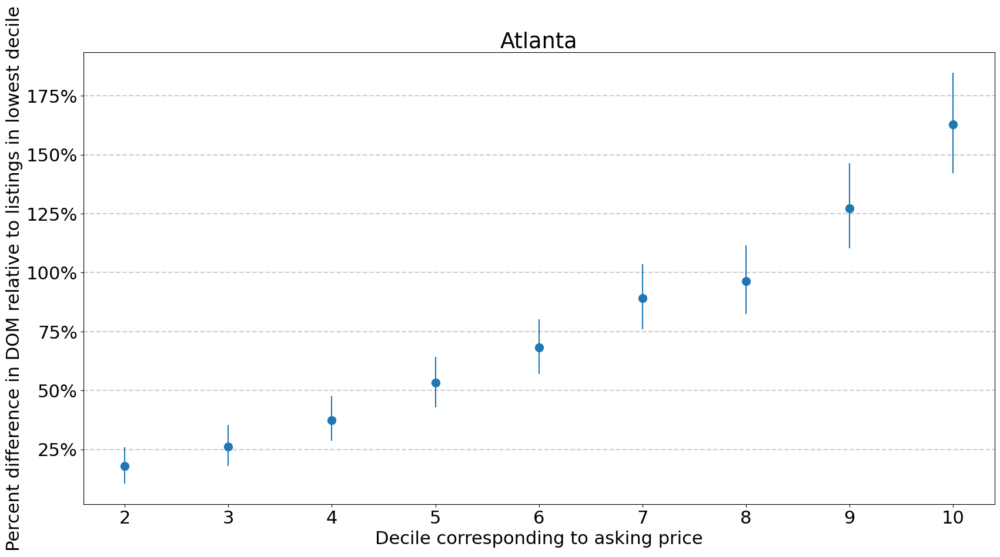

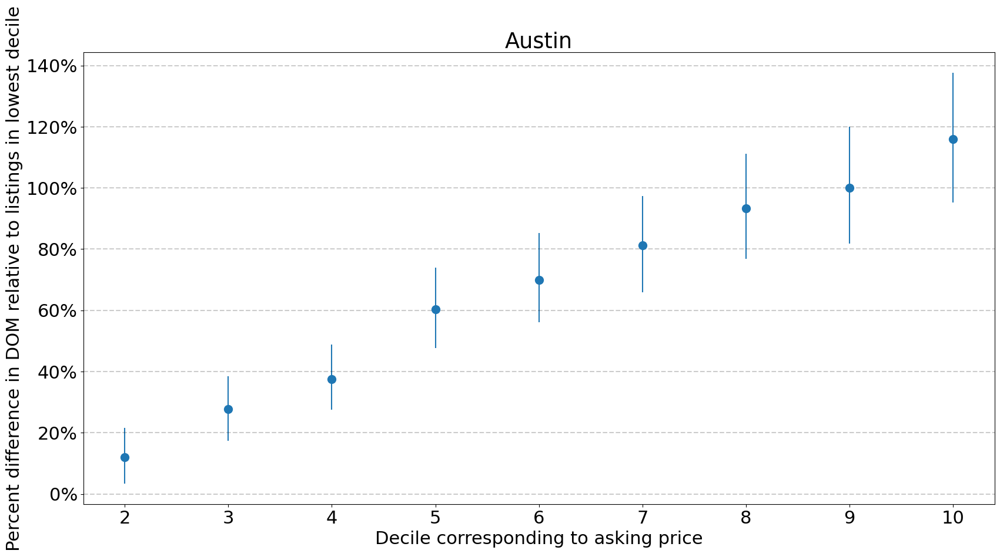

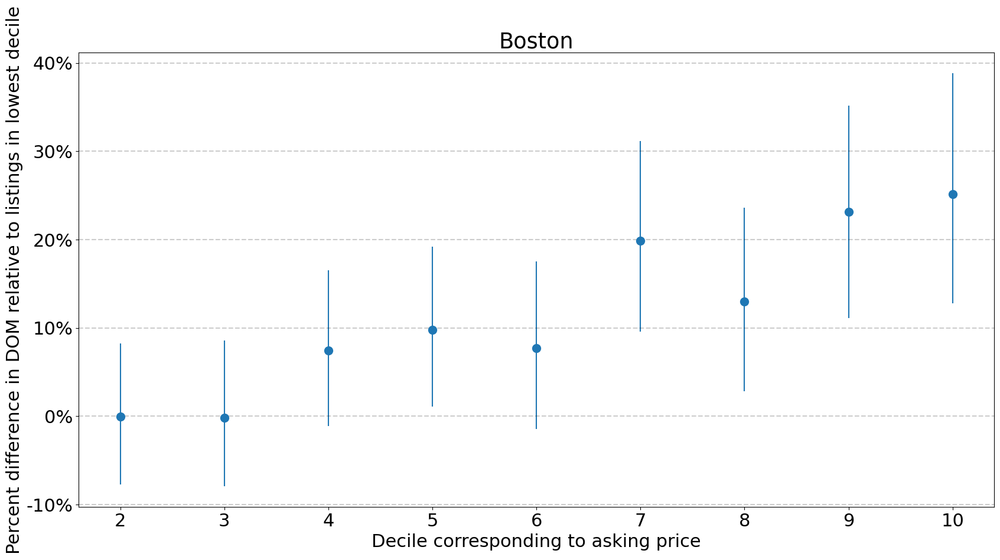

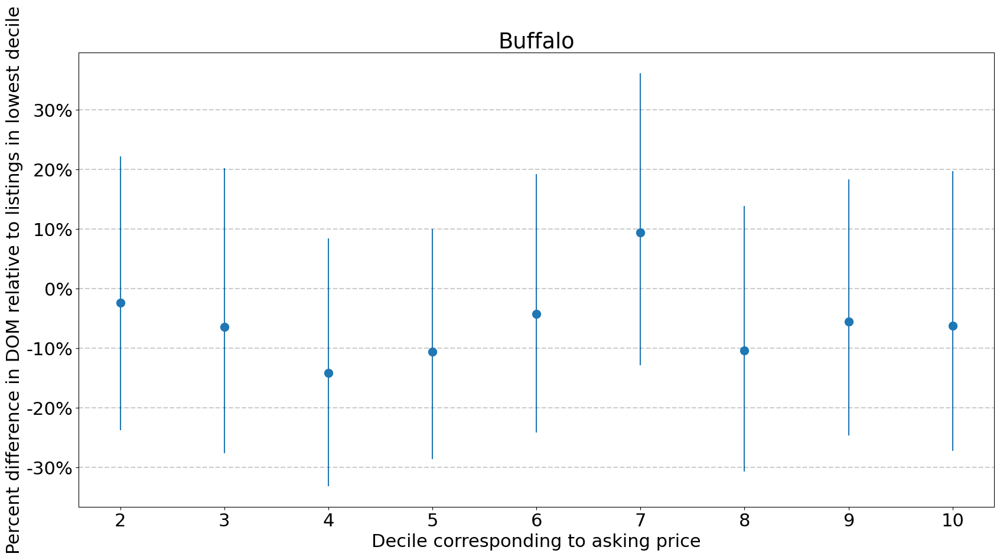

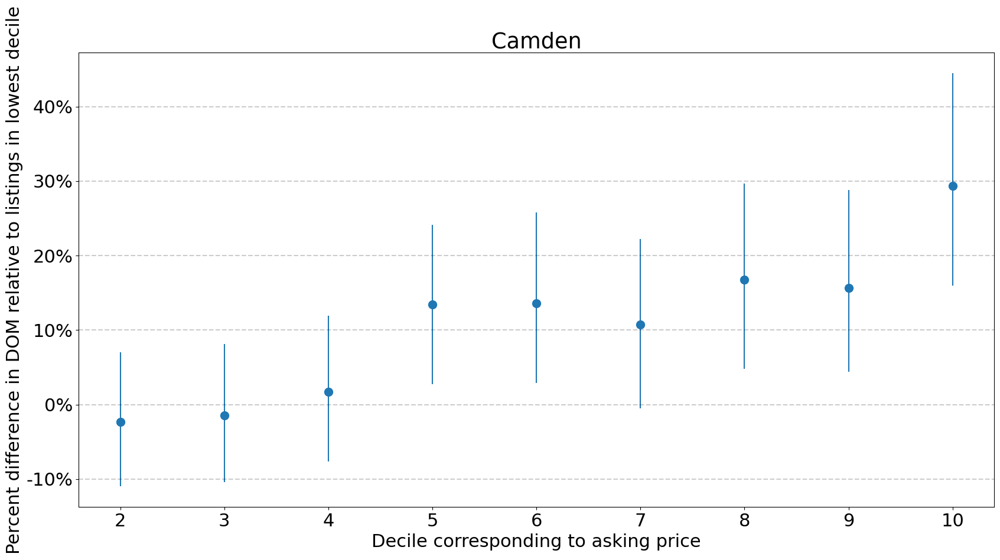

...

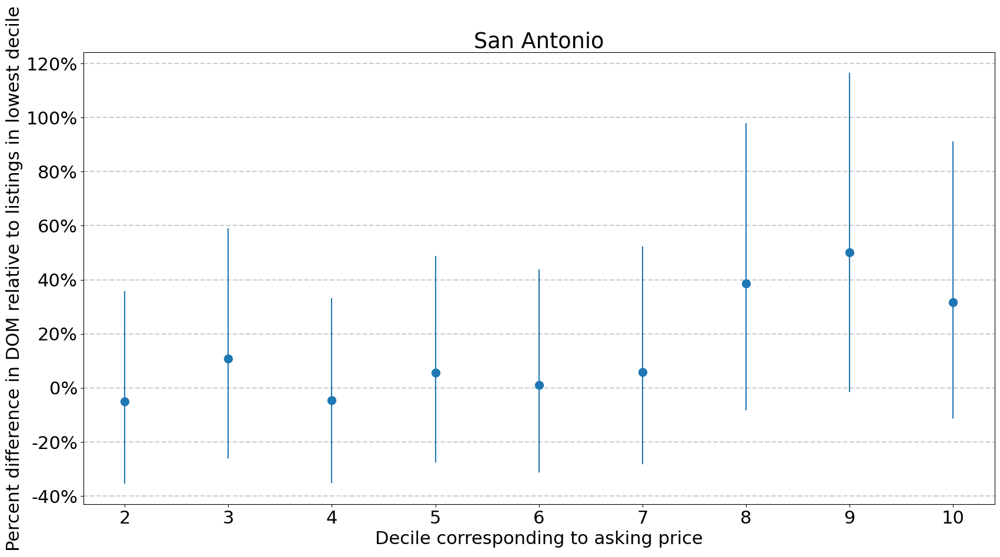

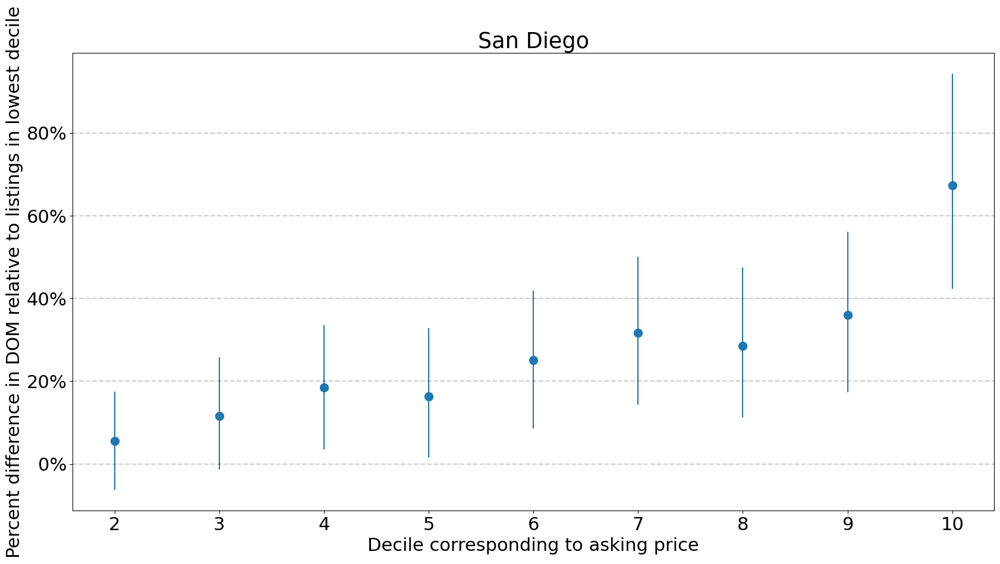

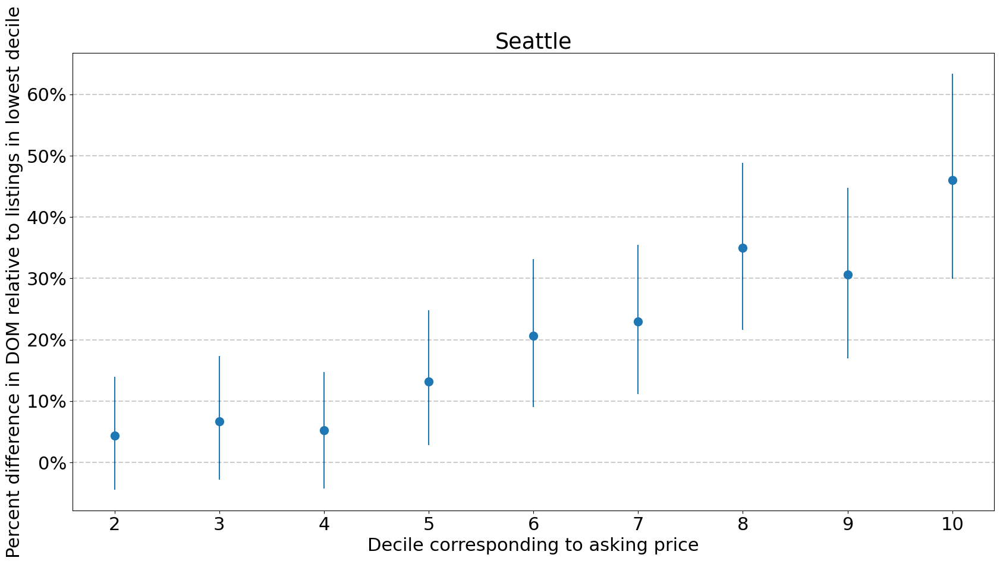

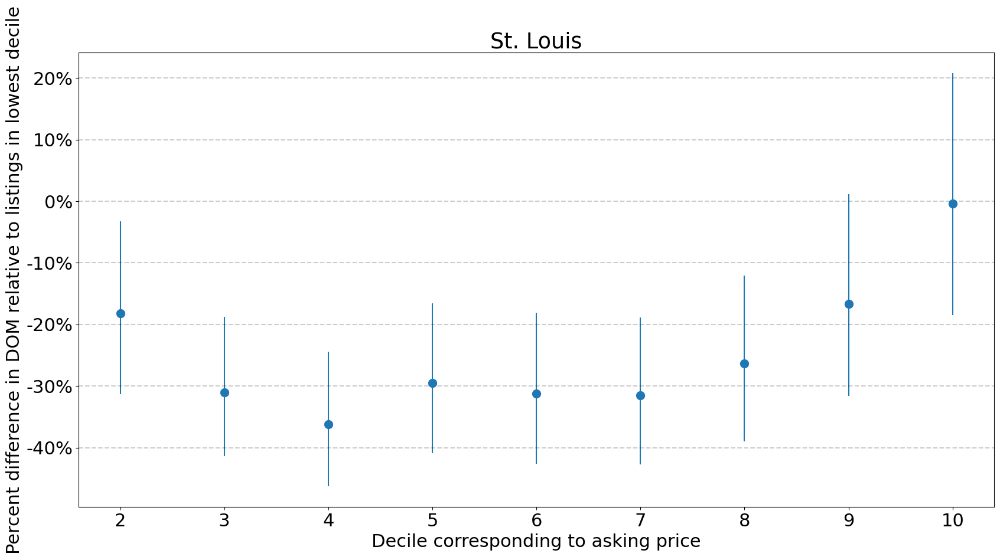

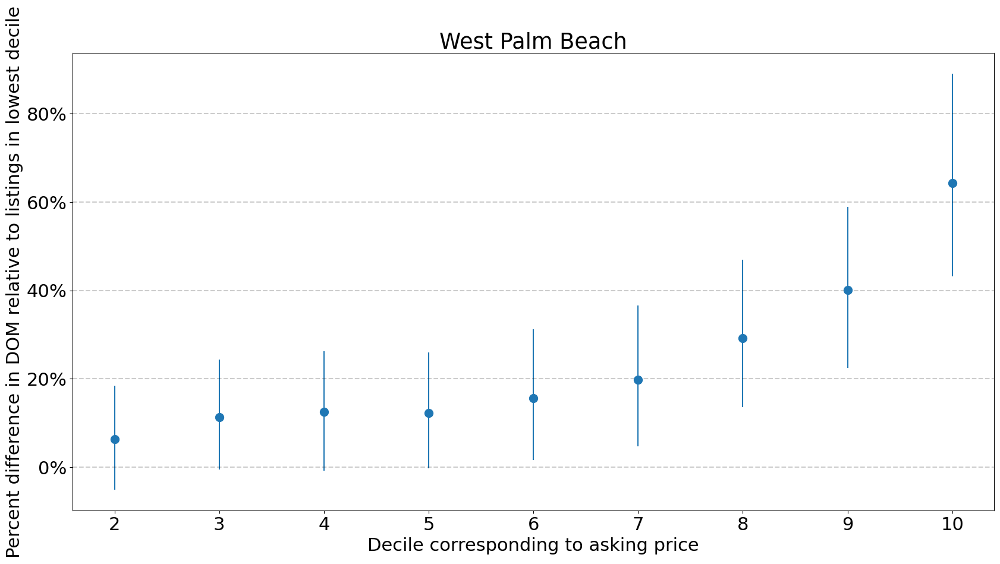

In [53]:
plot_effect_of_variables(
    'b_price', 
    x_label='Decile corresponding to asking price')

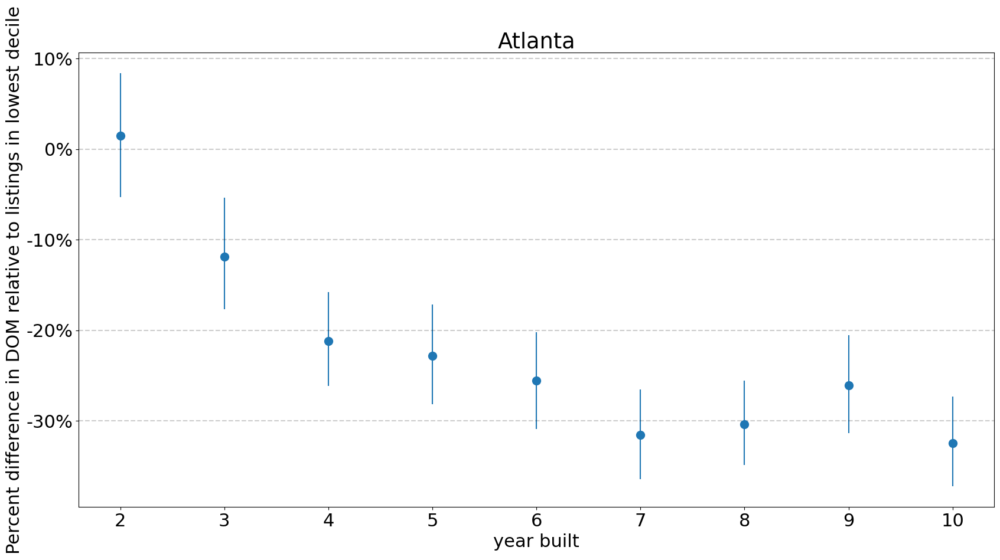

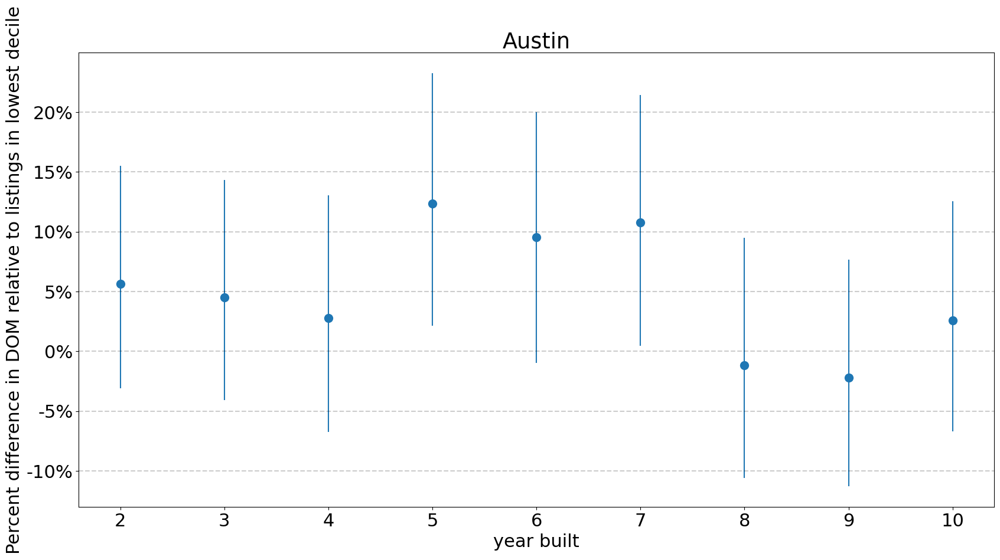

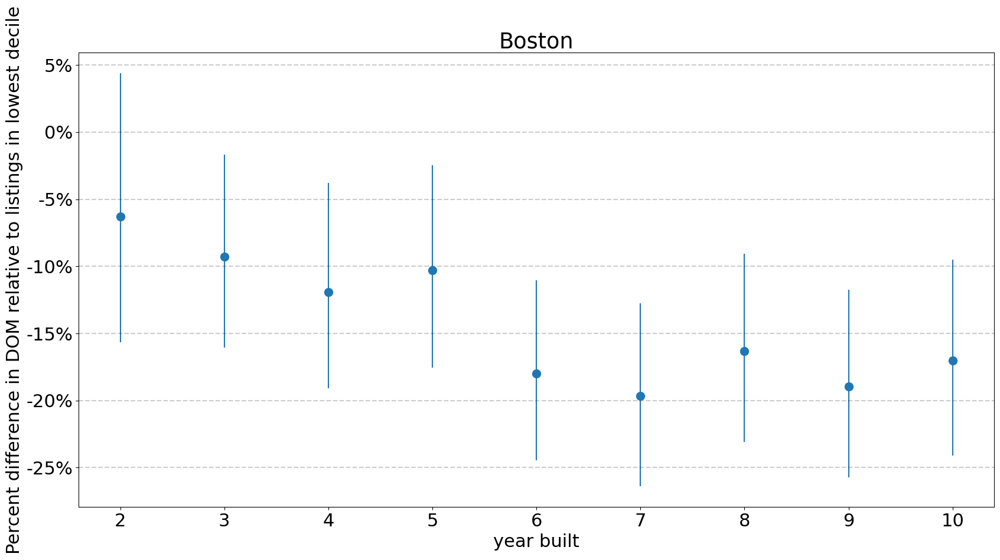

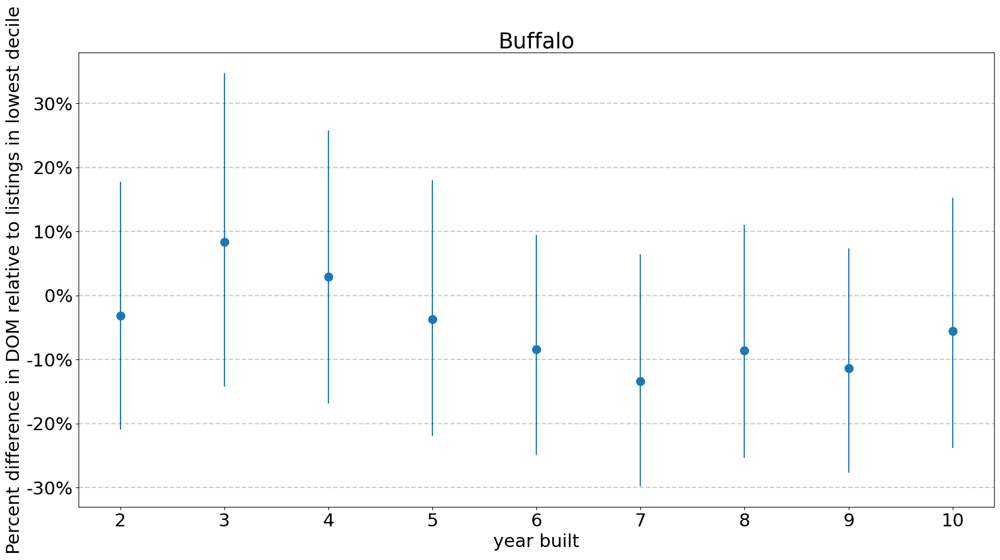

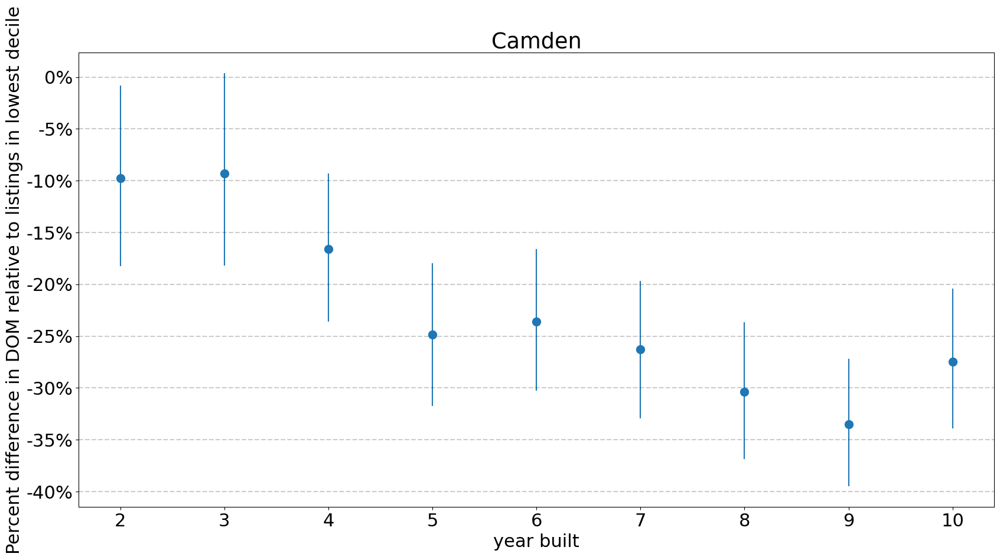

...

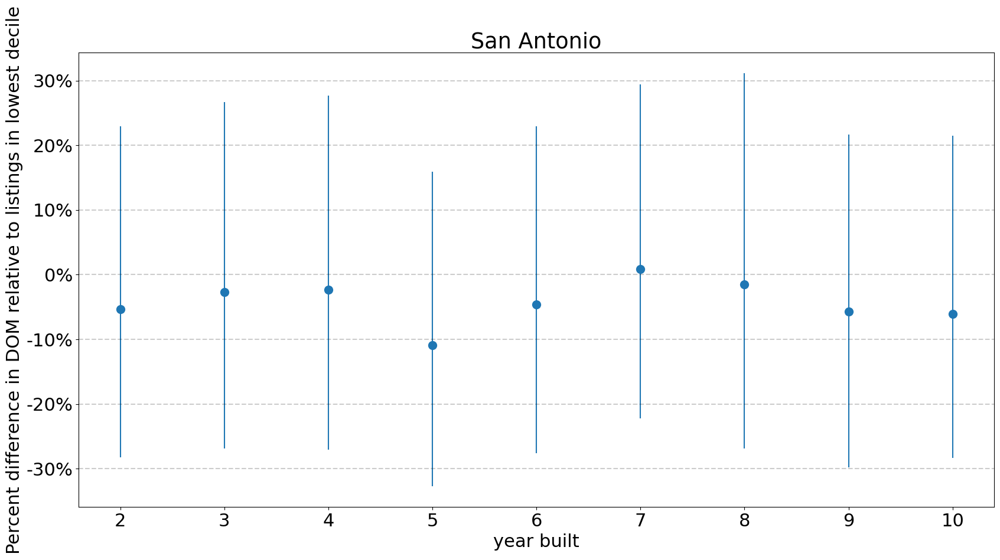

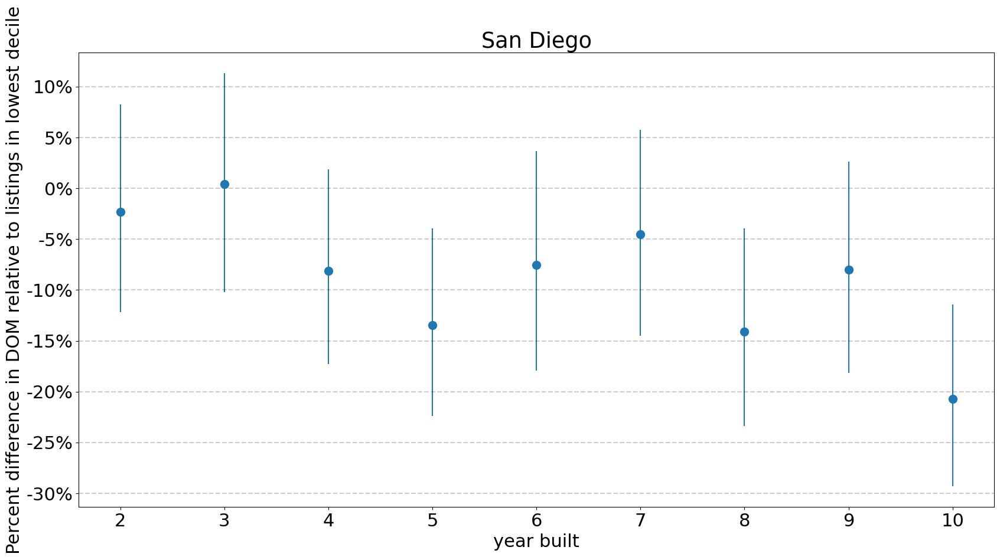

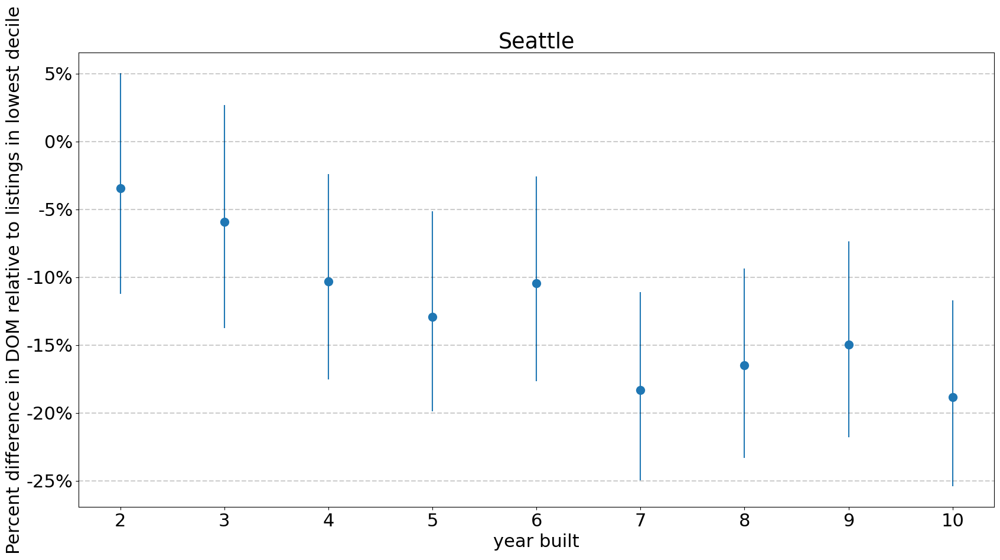

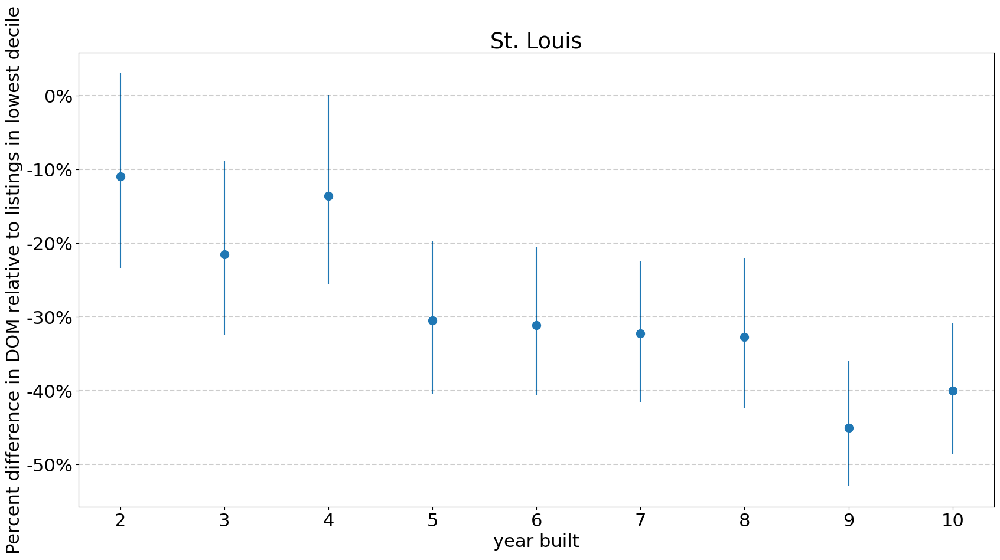

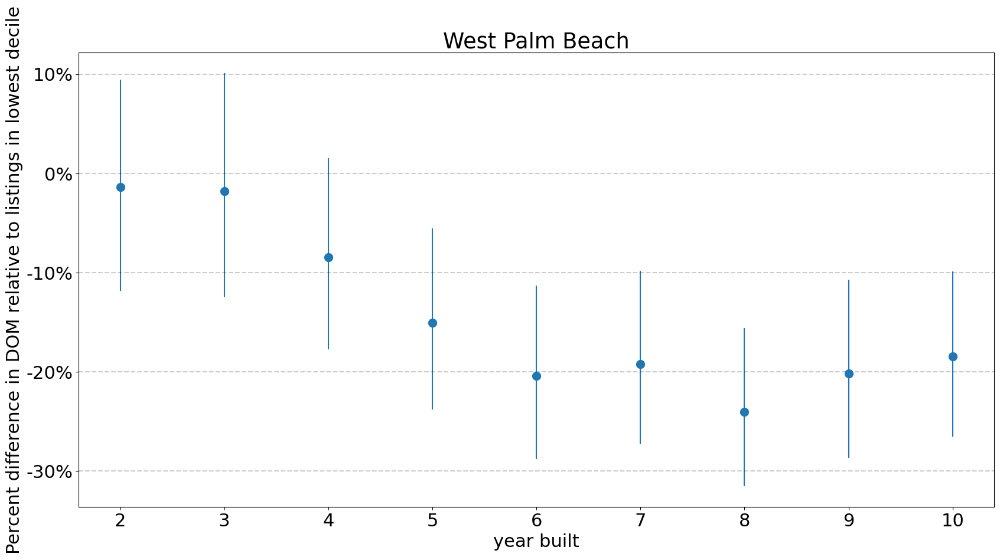

In [54]:
plot_effect_of_variables('b_year_built', 'year built')

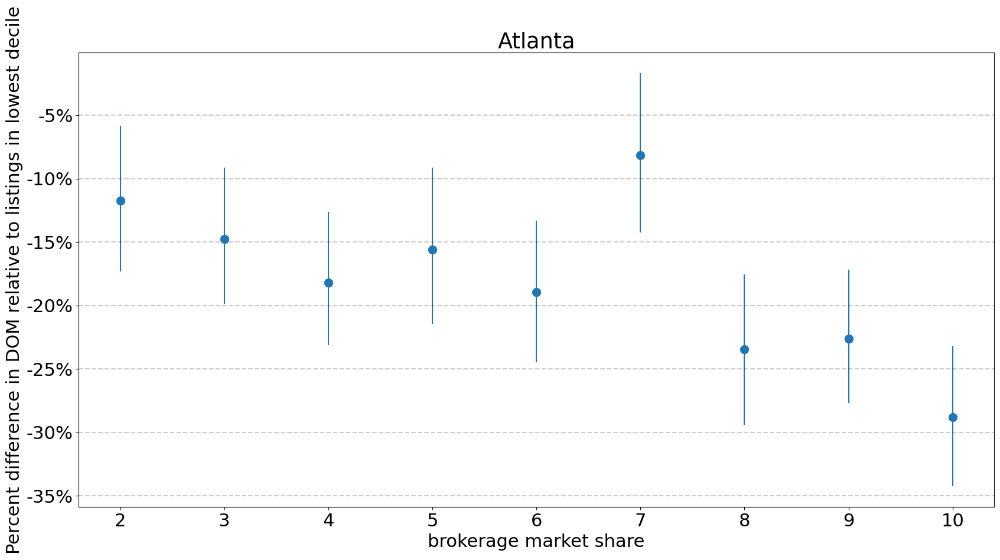

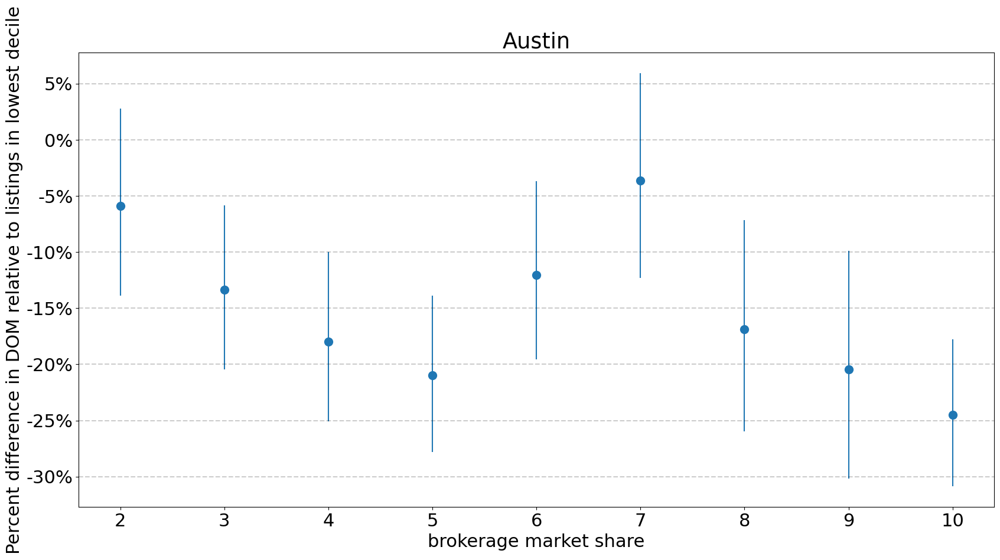

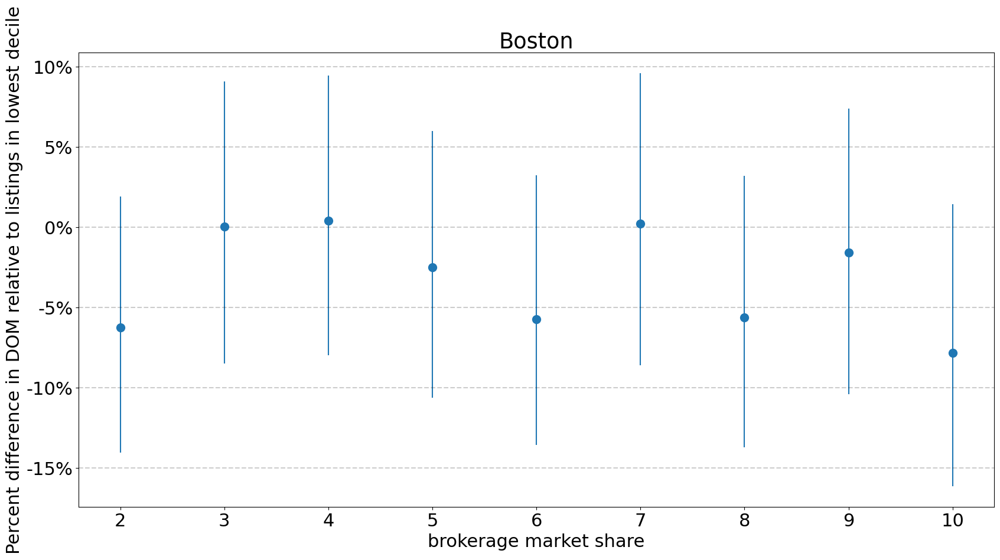

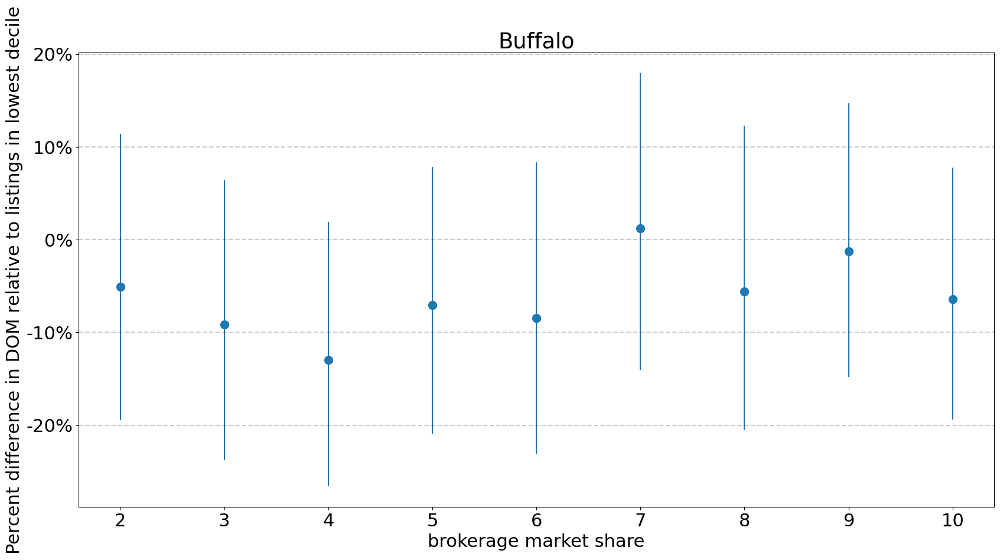

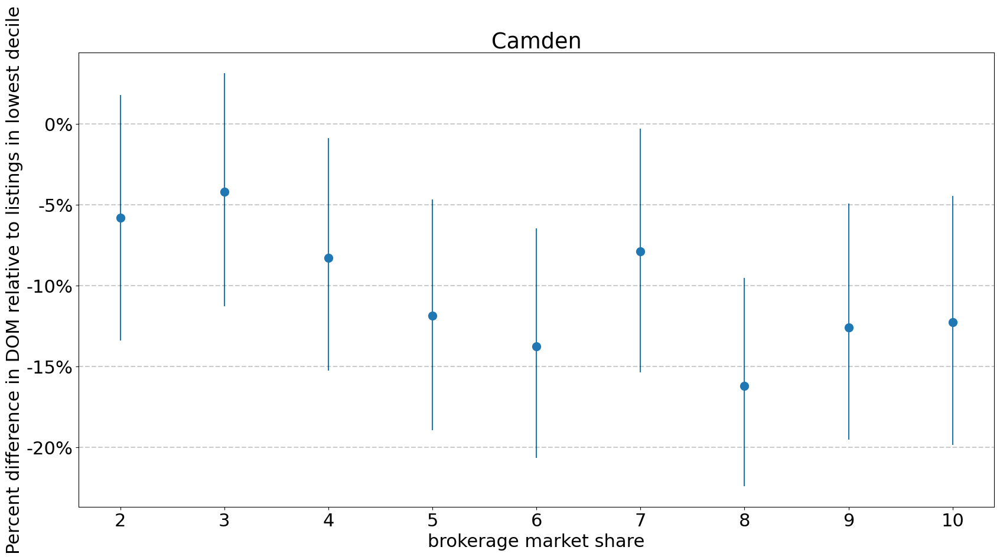

...

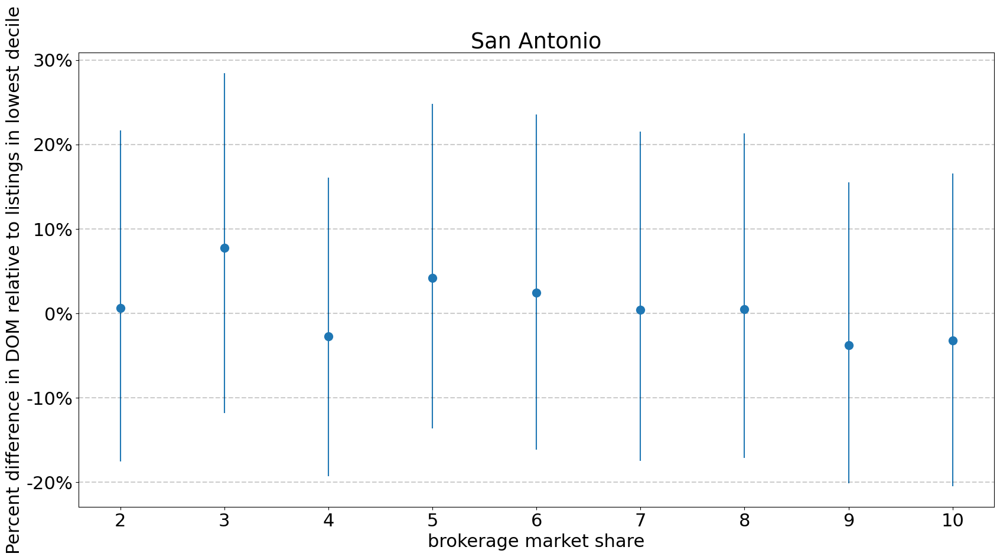

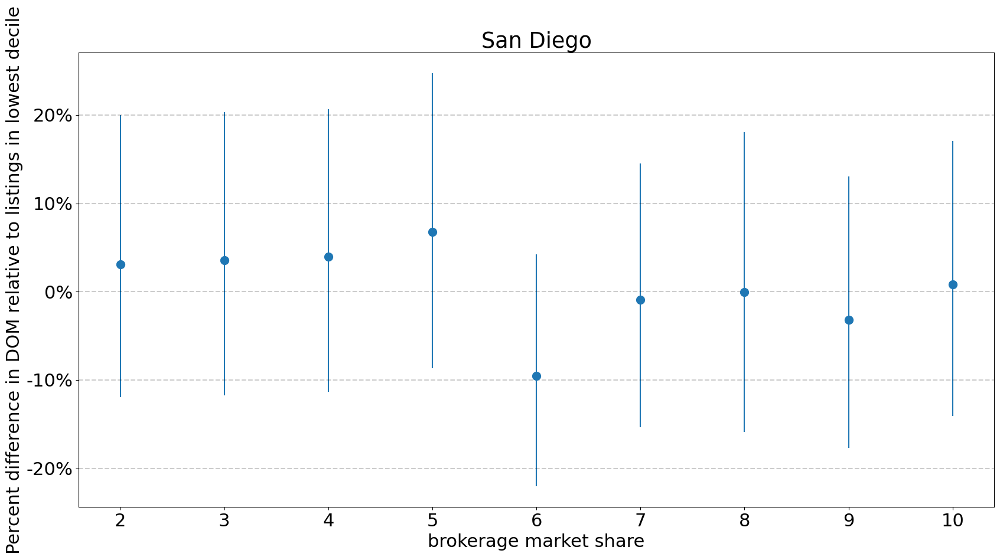

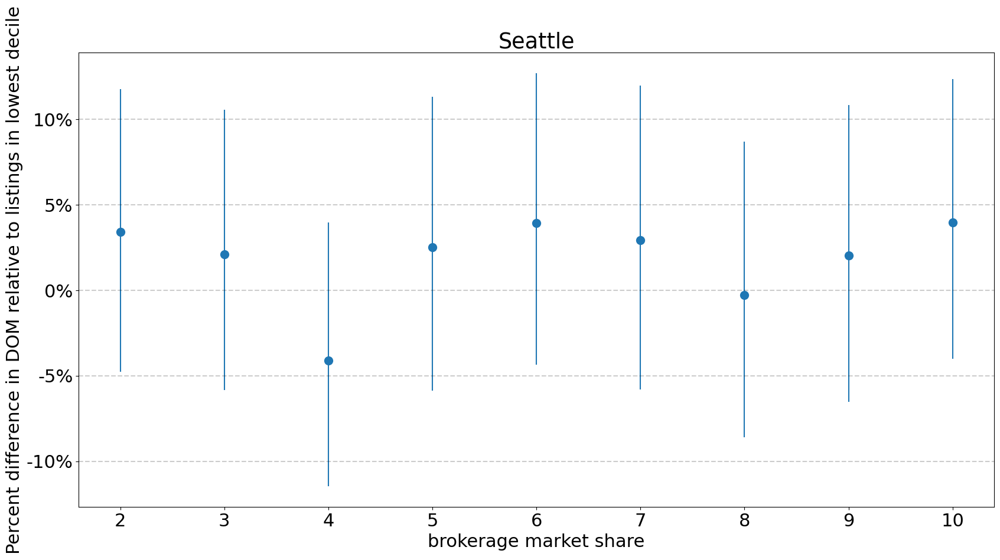

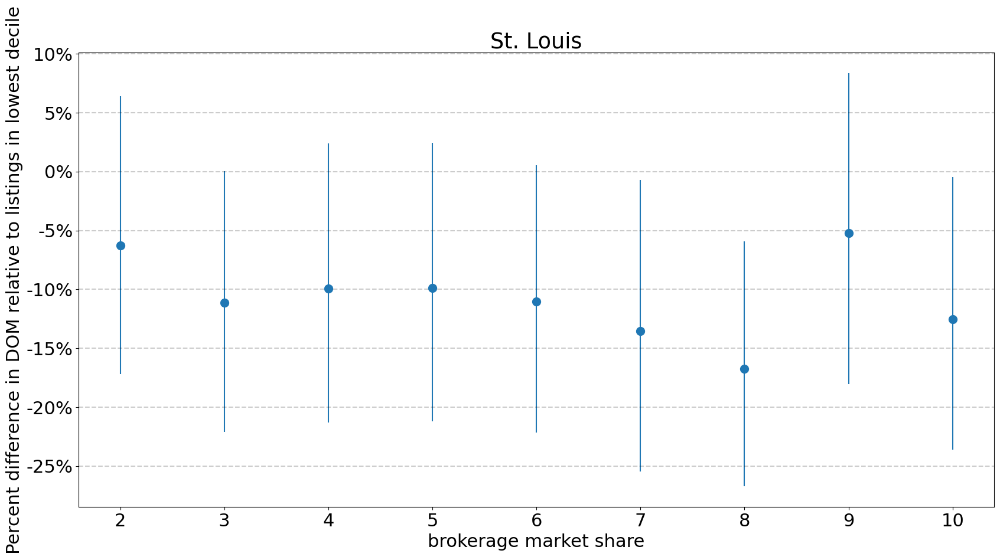

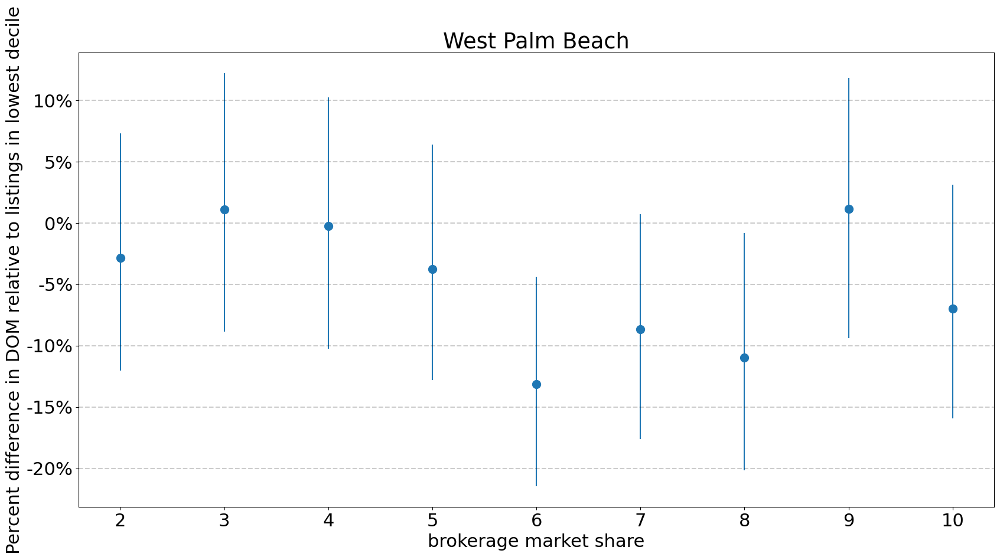

In [55]:
plot_effect_of_variables('b_brokerage_listings_pct', 'brokerage market share')

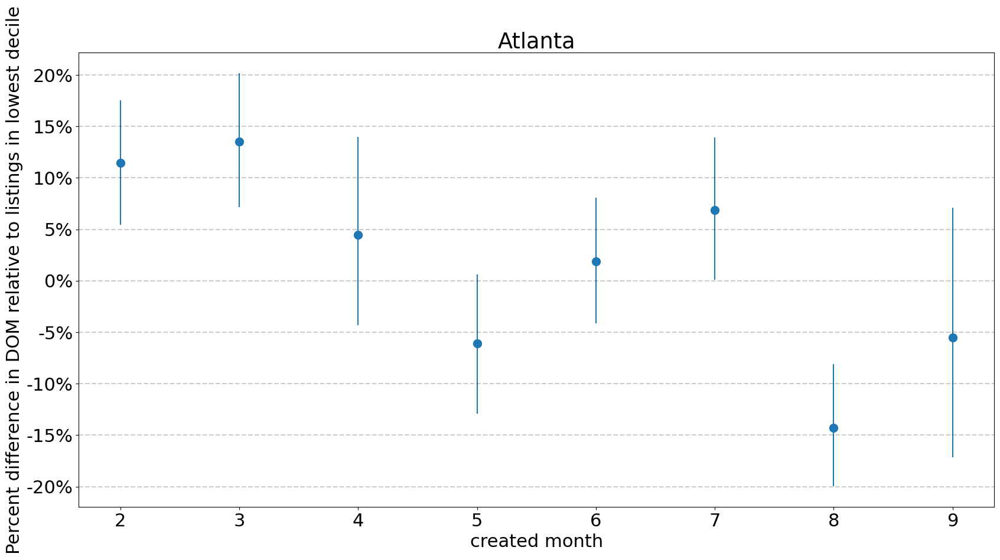

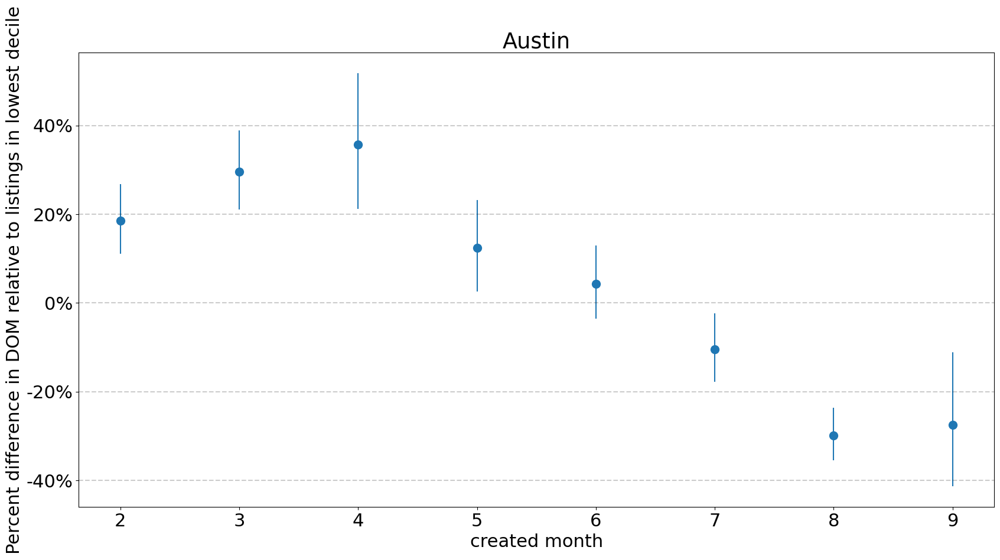

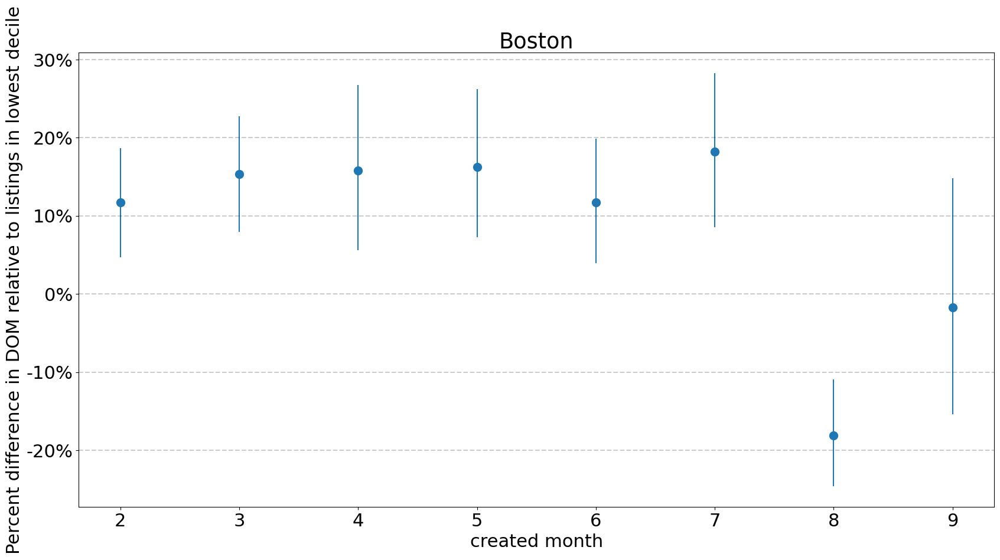

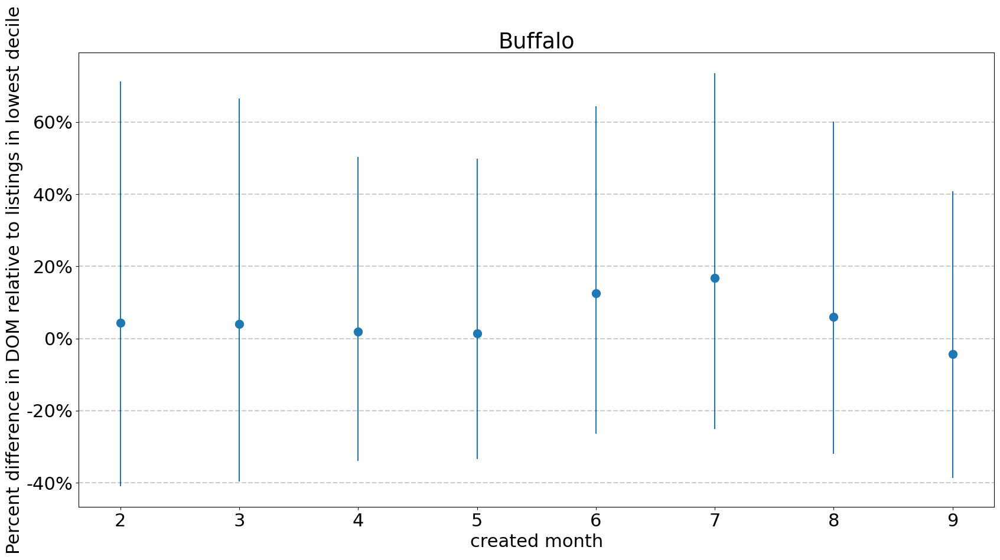

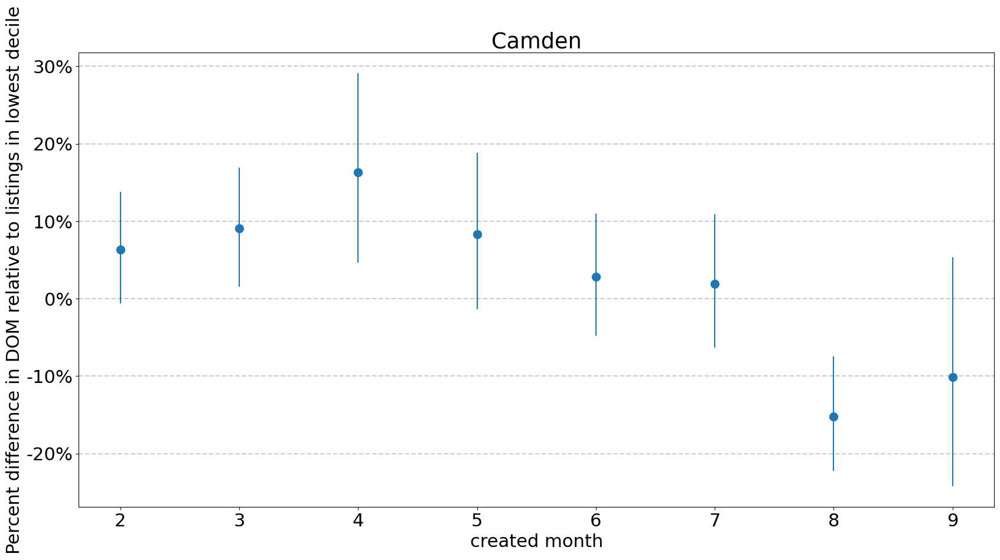

...

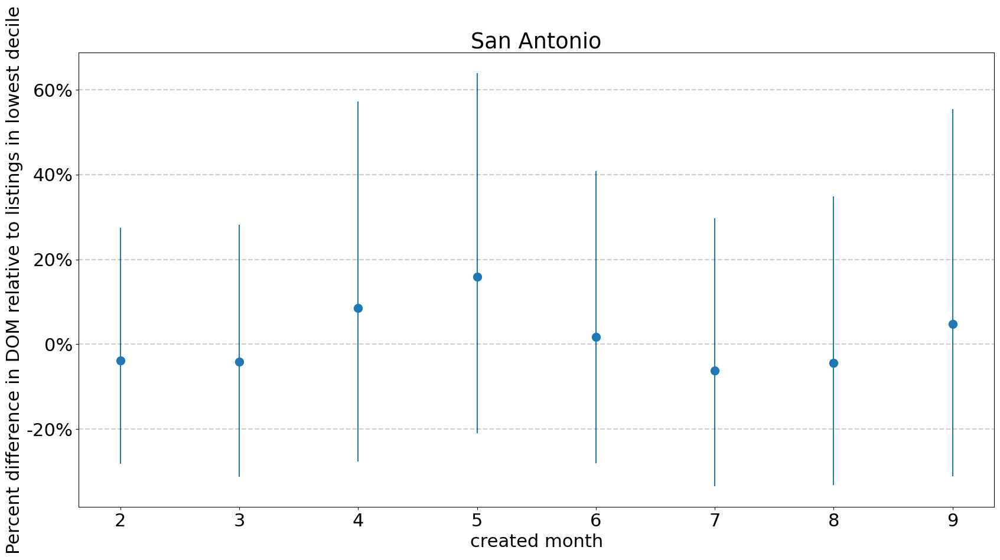

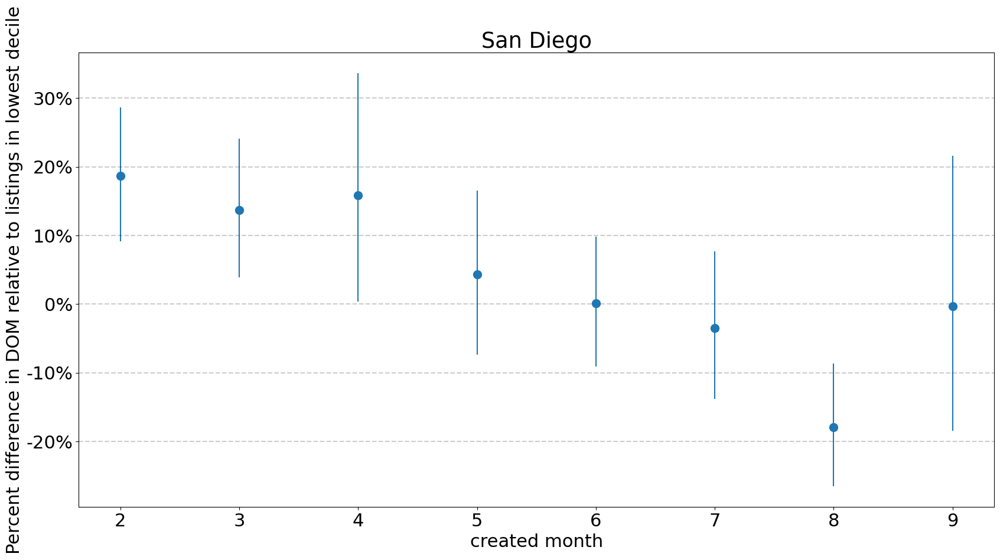

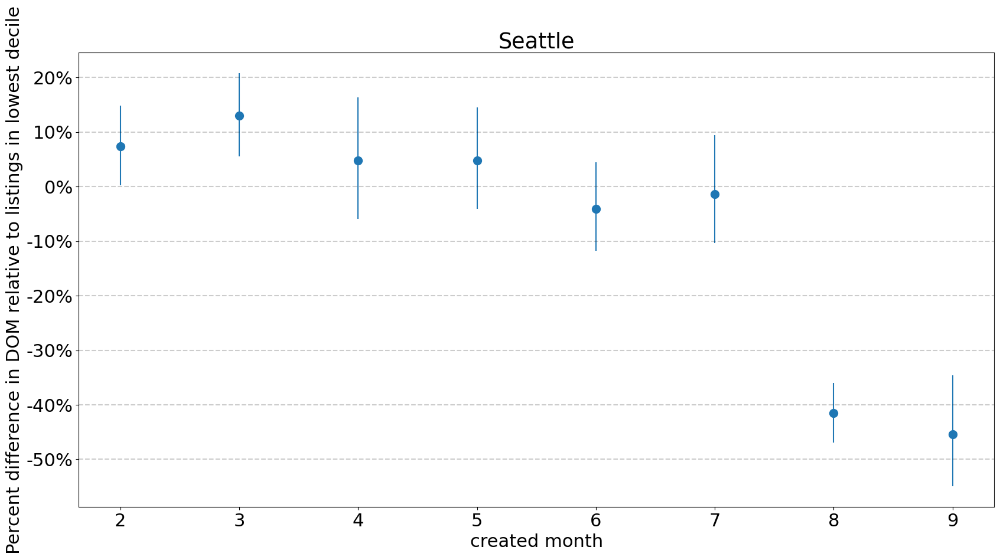

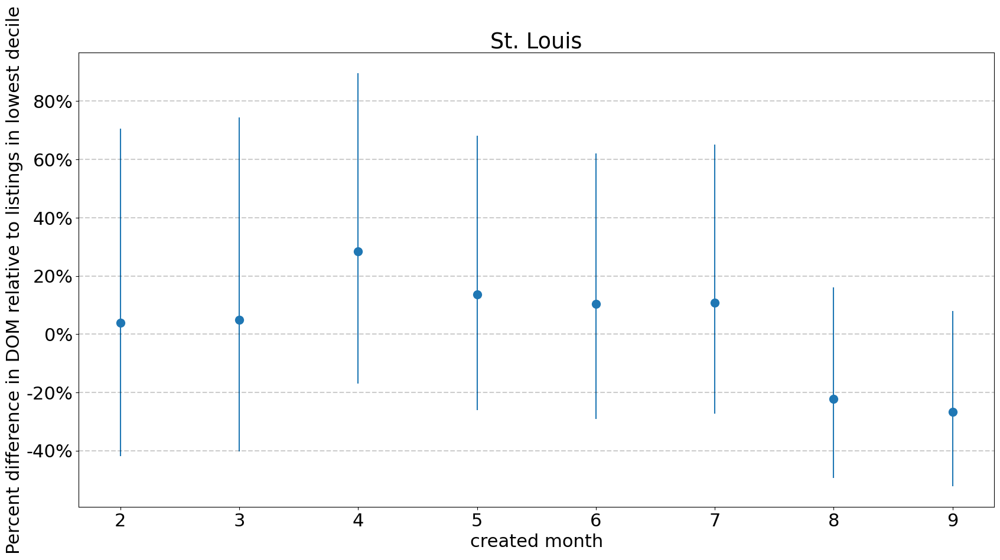

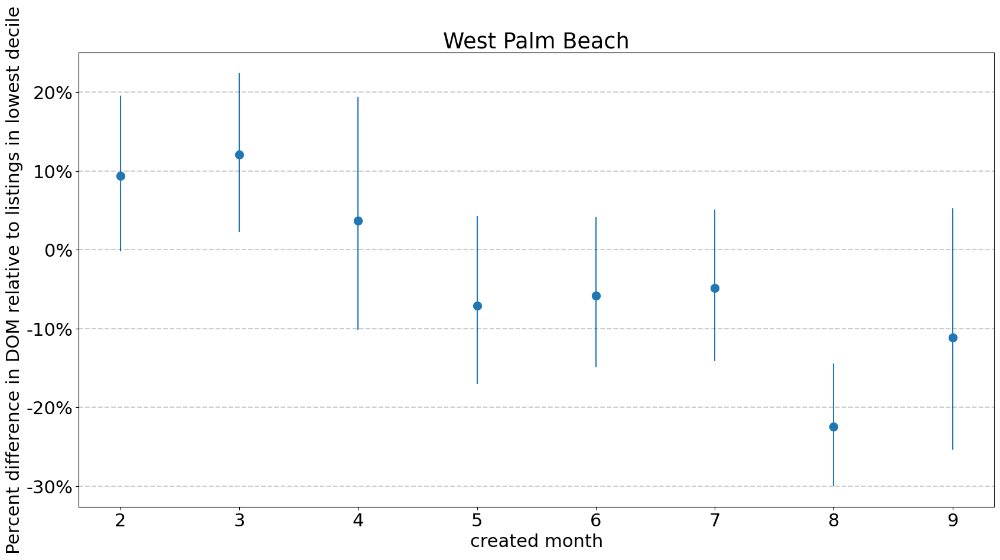

In [56]:
plot_effect_of_variables('b_created_month', 'created month')

In [57]:
brokerage_to_index_df = pd.read_csv('brokerage_to_index_df.csv')

In [58]:
d = {
    'redfin': 'Redfin',
    'none': 'other brokerage',
    'keller williams': 'Keller Williams',
    'berkshire hathaway': 'Berkshire Hathaway',
    'remax': 'RE/MAX',
    'century 21': 'Century 21',
    'coldwell banker': 'Coldwell Banker',
    'compass': 'Compass',
    'exp realty': 'EXp Realty'
}


brokerage_to_index_df2 = brokerage_to_index_df.copy()
brokerage_to_index_df2['processed_brokerage'].replace(d, inplace=True)
brokerage_to_index_df2 = brokerage_to_index_df2.sort_values('processed_brokerage').reset_index(drop=True)
brokerage_to_index_df2['processed_brokerage'].replace(
    {'other brokerage': 'Other brokerage', 'EXp Realty': 'eXp Realty'}, inplace=True)

number of Redfin listings: 118


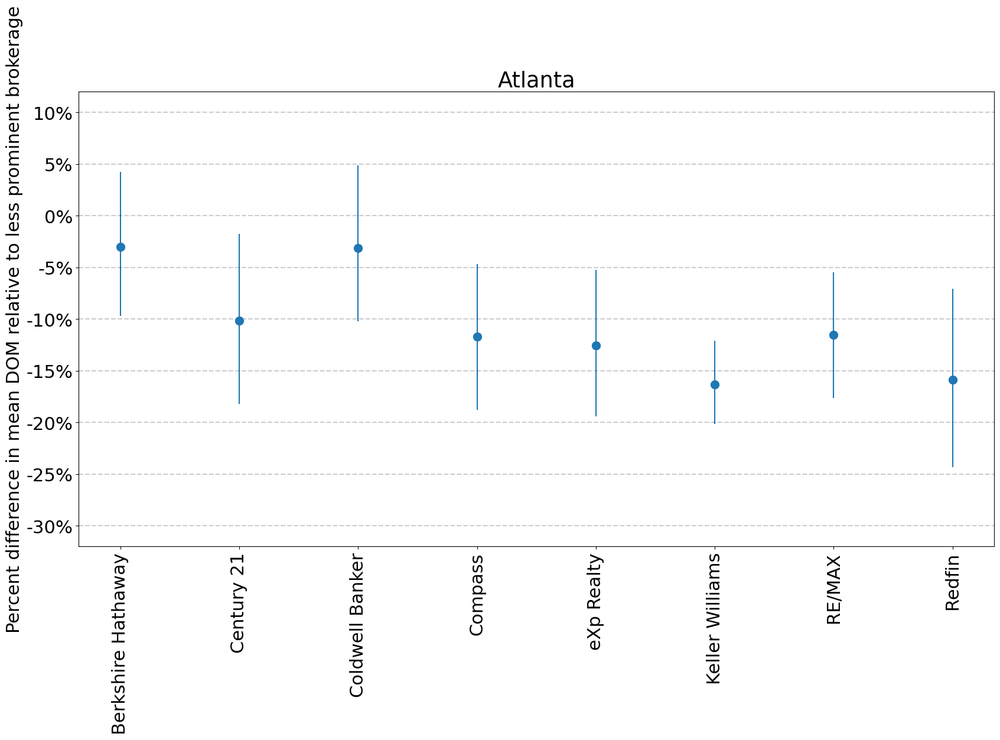

number of Redfin listings: 157


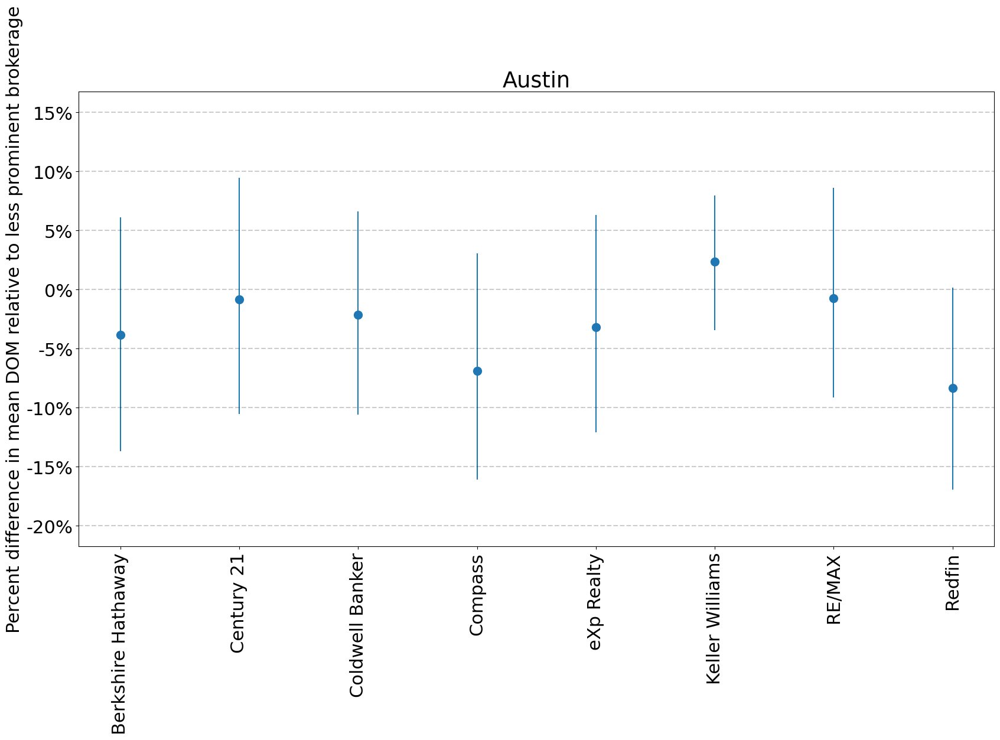

number of Redfin listings: 512


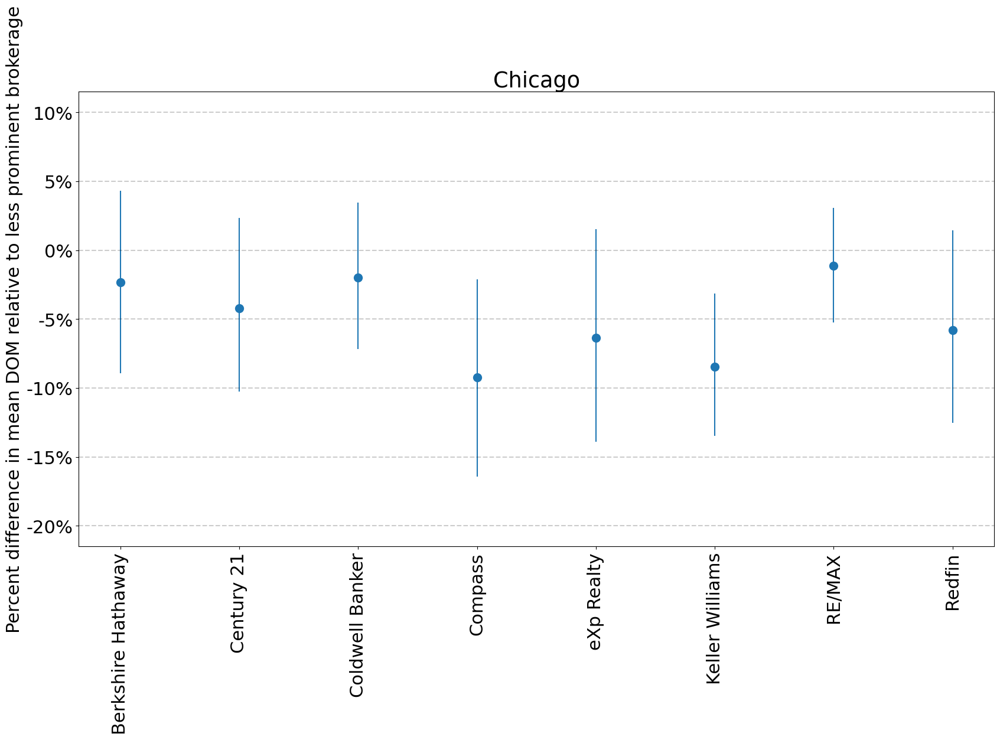

number of Redfin listings: 373


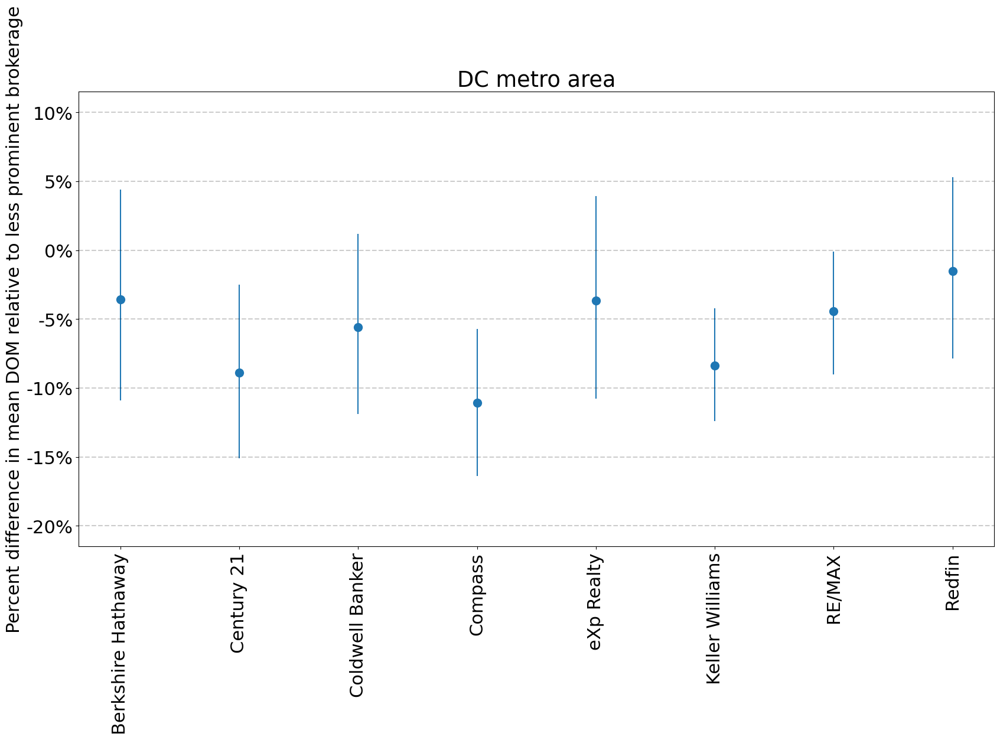

number of Redfin listings: 103


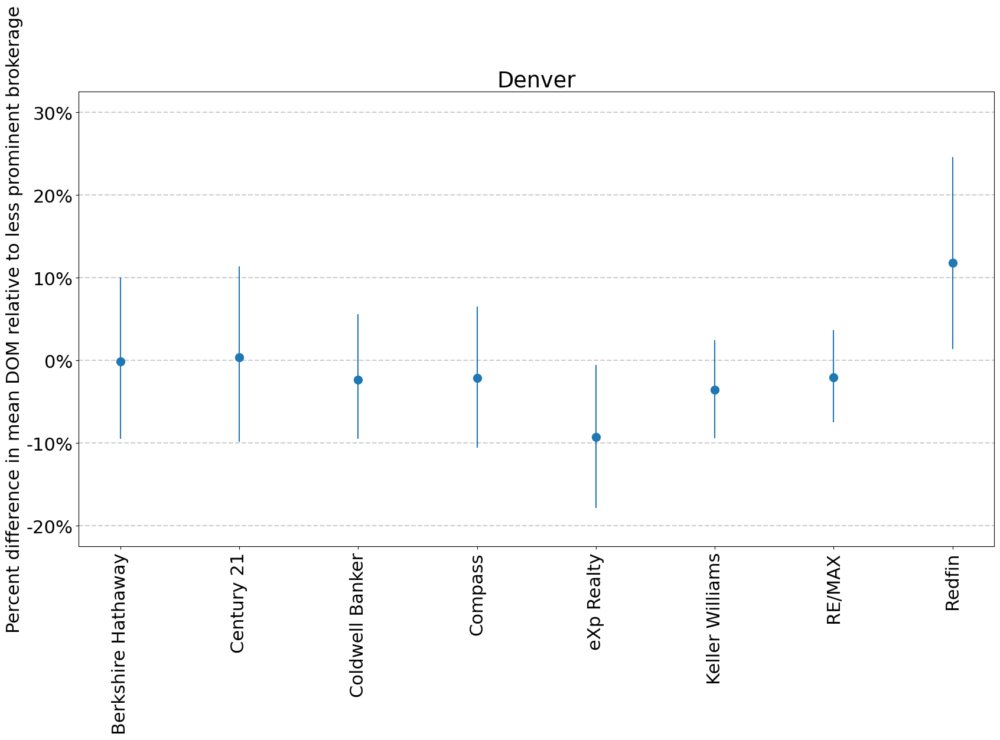

number of Redfin listings: 104


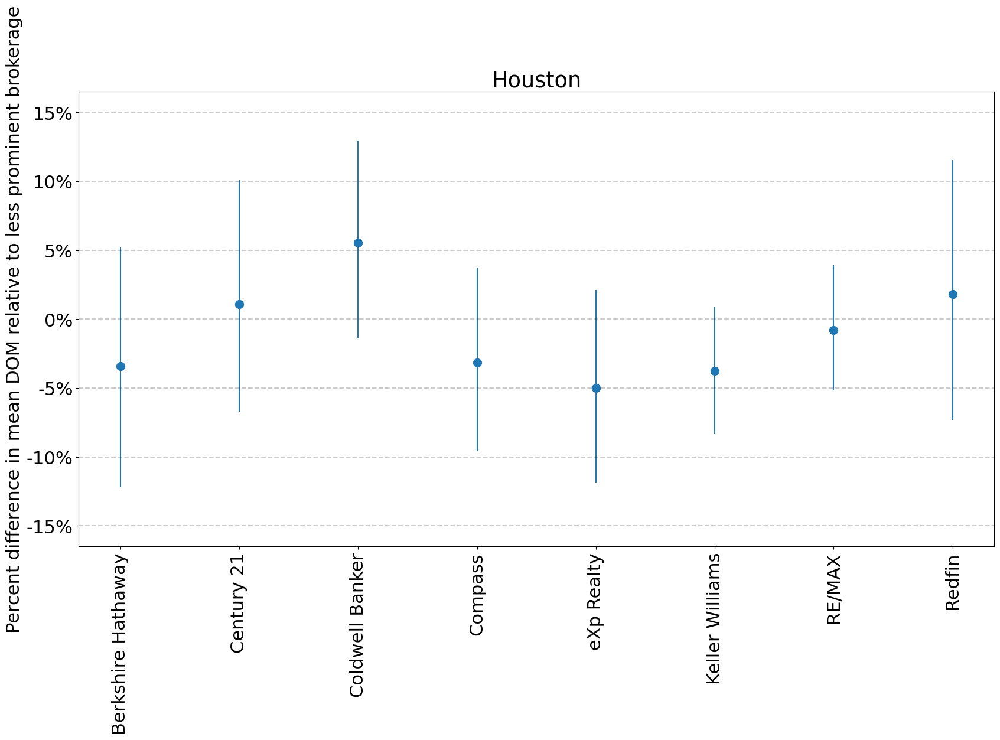

number of Redfin listings: 344


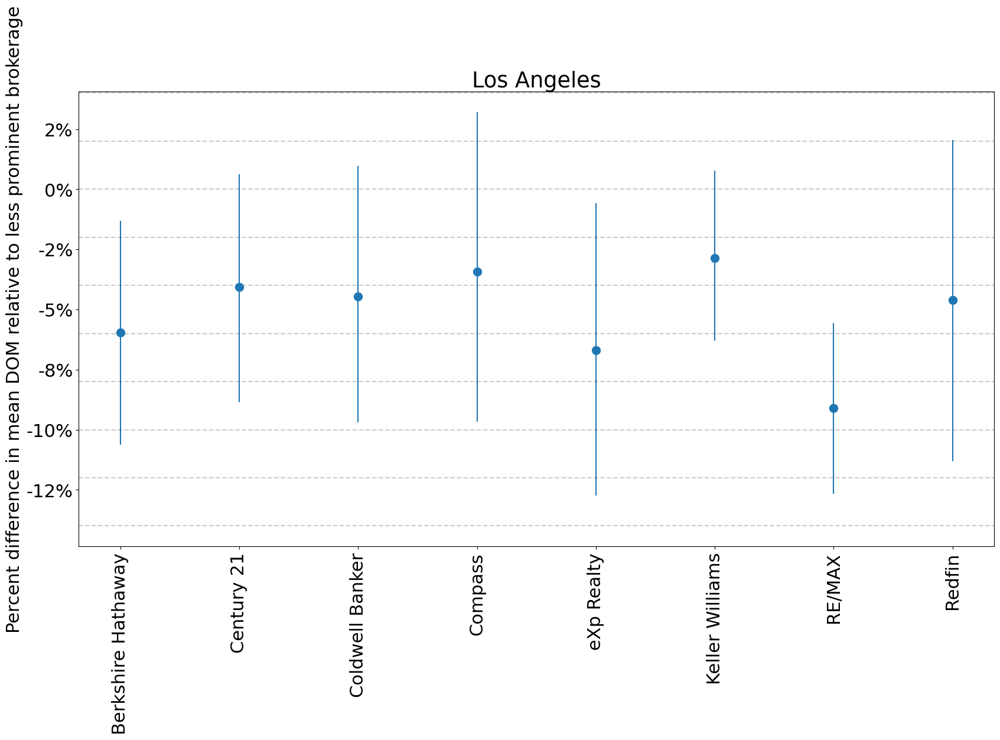

number of Redfin listings: 162


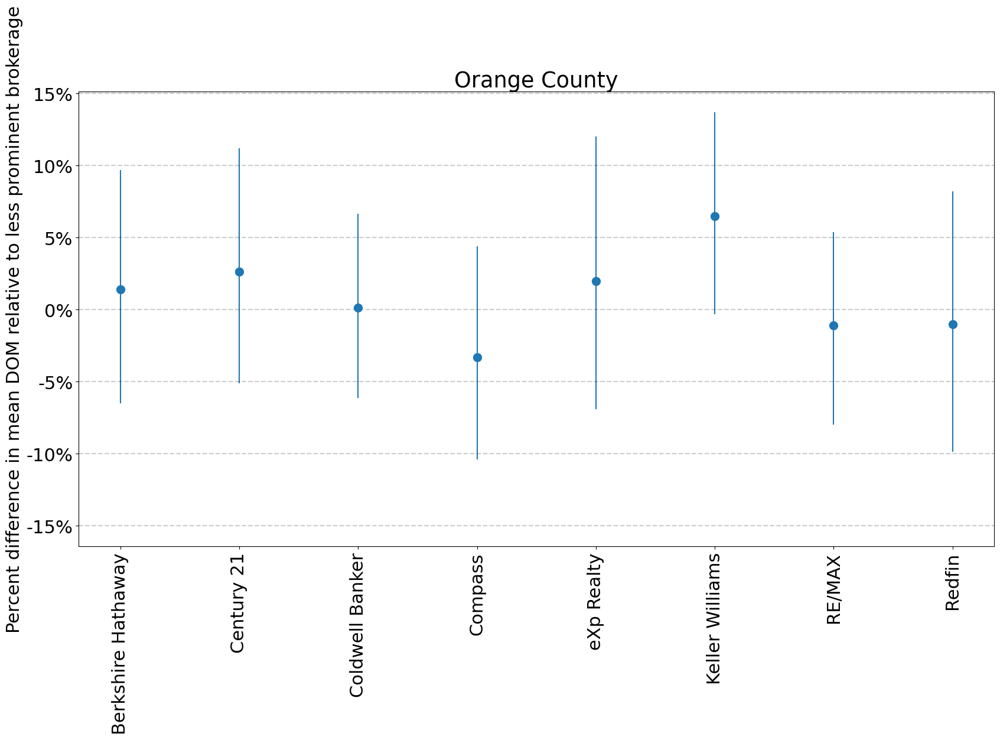

number of Redfin listings: 201


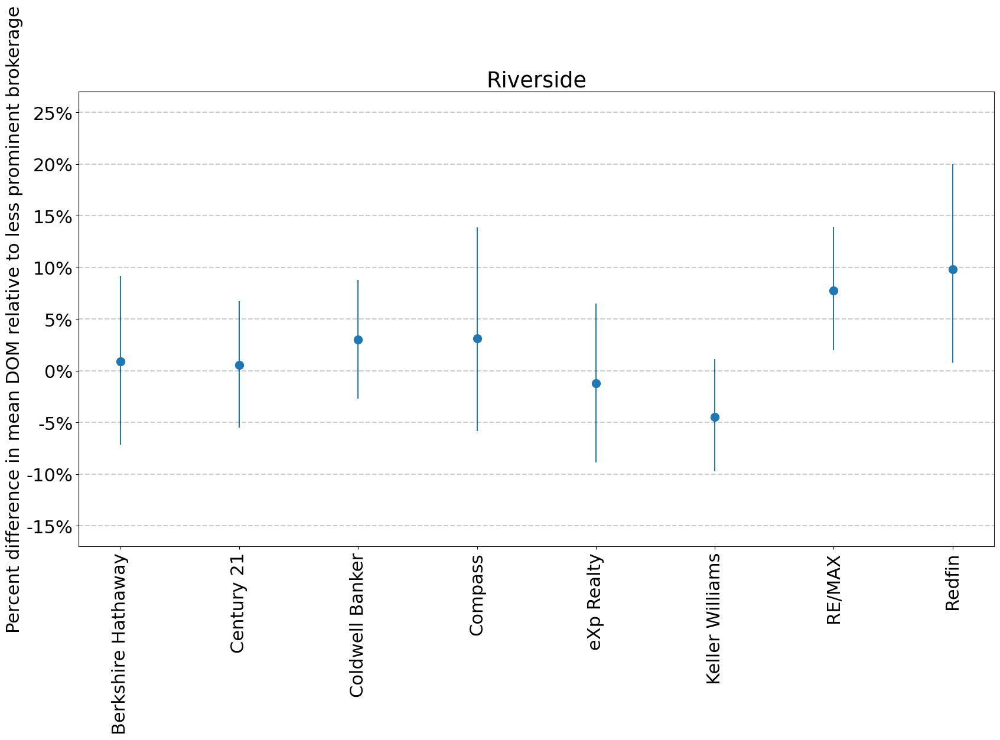

number of Redfin listings: 138


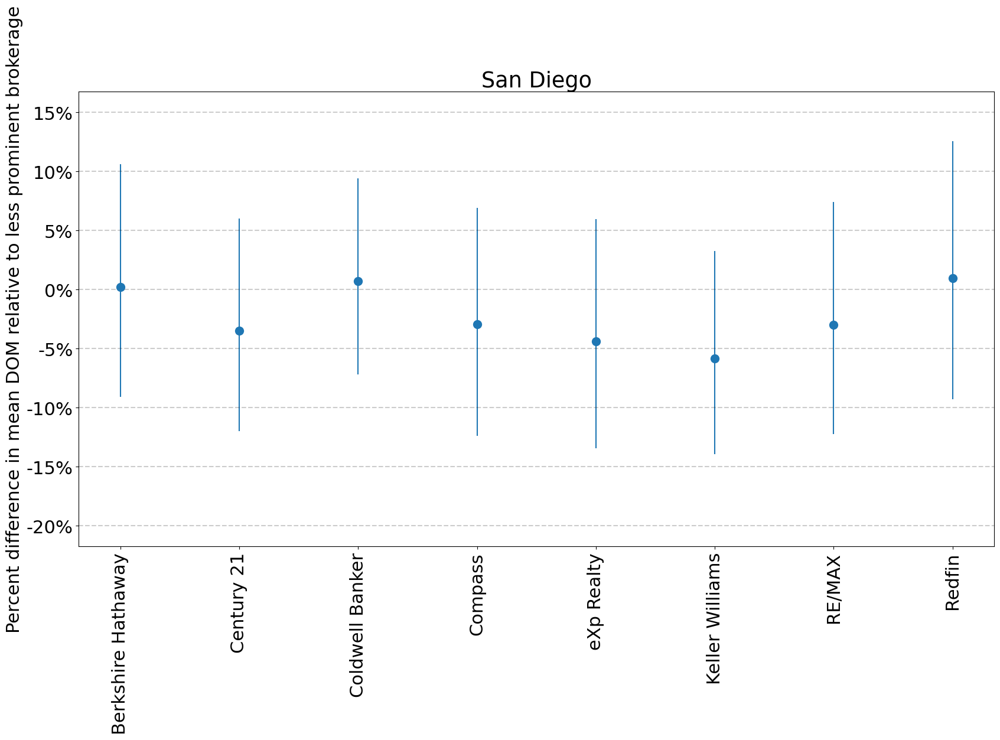

number of Redfin listings: 306


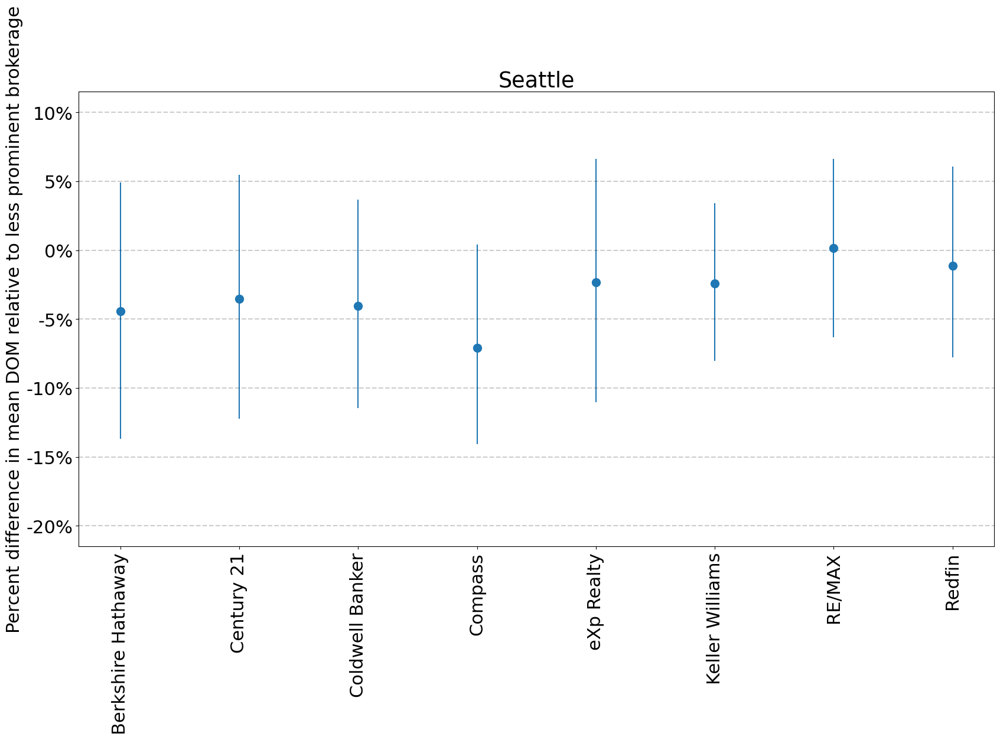

In [59]:
alpha = 0.05
b_brokerage_mat = log_trace['b_brokerage']

other_brokerage_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Other brokerage'].iloc[0]['brokerage_index']
    
for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    market_area_index = row['market_area_index']
    b_samples = b_brokerage_mat[:, market_area_index, :]
    redfin_index = brokerage_to_index_df2[
        brokerage_to_index_df2['processed_brokerage'] == 'Redfin'].iloc[0]['brokerage_index']
    redfin_listings_df = final_df_f[(final_df_f['market_area'] == market_area) &
                                    (final_df_f['brokerage_index'] == redfin_index)]
    
    # ignore markets that have fewer than 100 Redfin listings
    if len(redfin_listings_df) < 100:
        continue
    print('number of Redfin listings:', len(redfin_listings_df))
    plt.figure(figsize=(20, 10))
    x_vals = []
    y_vals = []
    y_err = np.zeros((2, top_brokerage_vals - 1))
    for i in range(top_brokerage_vals - 1):
        idx = brokerage_to_index_df2.iloc[i]['brokerage_index']
        samples = 100 * (np.exp(b_samples[:, idx] - b_samples[:, other_brokerage_index]) - 1)
        x_vals.append(i)
        sample_mean = np.mean(samples)
        y_vals.append(sample_mean)
        quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
        errors = np.abs(quantiles - sample_mean)
        y_err[:, i] = errors

    plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
    plt.xticks(x_vals, brokerage_to_index_df2['processed_brokerage'][:-1], rotation=90)
    plt.ylabel('Percent difference in mean DOM relative to less prominent brokerage')
    plt.title(market_area)

    yticks = plt.yticks()[0]
    for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
    
    plt.gca().set_yticklabels([f'{y/100:.0%}' for y in plt.gca().get_yticks()]) 
    plt.show()

## Limiting analysis to listings represented by agents willing to offer low buyer's agent commissions

In [49]:
entire_df = final_df_f.drop(columns=['market_area_index'])

In [50]:
entire_df['unique_agent_identifier'] = (
    entire_df['agent_name'] + entire_df['brokerage'] + entire_df['market_area']
)

In [51]:
discount_agents = entire_df[
    entire_df['buyside_commission_range'] > 0]['unique_agent_identifier'].unique()

In [52]:
discount_agent_df = entire_df[entire_df['unique_agent_identifier'].isin(discount_agents)]

In [53]:
unique_agent_count = len(entire_df['unique_agent_identifier'].unique())
discount_agent_count = len(discount_agents)

print('number of unique agents:', unique_agent_count)
print('number of discount agents:', discount_agent_count)
print('fraction of agents that are discount agents:', round(discount_agent_count / unique_agent_count, 3))
print('fraction of listings represented by discount agents:', round(len(discount_agent_df) / len(entire_df), 3))

number of unique agents: 112549
number of discount agents: 18422
fraction of agents that are discount agents: 0.164
fraction of listings represented by discount agents: 0.217


In [54]:
discount_agent_df['buyside_commission_range'].value_counts() / len(discount_agent_df)

2    0.426733
0    0.277196
1    0.253045
3    0.043026
Name: buyside_commission_range, dtype: float64

In [55]:
market_area_value_counts = discount_agent_df['market_area'].value_counts()
market_area_value_counts

Los Angeles          9367
Chicago              4485
Atlanta              4446
Dallas               3289
Houston              2908
Denver               2130
DC metro area        1843
San Diego            1699
Austin               1631
Portland, OR         1393
West Palm Beach      1086
Philadelphia          965
Fort Lauderdale       942
Camden                842
Riverside             769
Indianapolis          720
Phoenix               556
Kansas City           541
Seattle               400
Orange County         357
St. Louis             252
Research-Triangle     251
Columbus              250
Cleveland             237
Buffalo               217
Jersey Shore          194
Orlando               112
San Antonio           106
Hartford              103
Boston                 88
Pittsburgh             81
Providence             17
Name: market_area, dtype: int64

In [56]:
# remove markets with very few listings
small_market_area_threshold = 100
small_market_areas = market_area_value_counts[market_area_value_counts < small_market_area_threshold].index
discount_agent_df_final = discount_agent_df[
    ~discount_agent_df['market_area'].isin(small_market_areas)]

In [57]:
sorted_market_areas = sorted(list(discount_agent_df_final['market_area'].unique()))

In [58]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [59]:
discount_agent_df_final = discount_agent_df_final.merge(
    market_area_to_index_df, on='market_area', how='inner')

In [60]:
dom_values = discount_agent_df_final['dom'].to_numpy()
log_dom_values = np.log(dom_values)
market_area_indices = discount_agent_df_final['market_area_index'].to_numpy()

In [61]:
commission_vals = discount_agent_df_final['buyside_commission_range'].nunique()
created_month_vals = discount_agent_df_final['created_month_index'].nunique()
property_category_vals = discount_agent_df_final['property_category_index'].nunique()

In [62]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as discount_log_model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=14)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[13], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, discount_agent_df_final['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * discount_agent_df_final['hoa'] + 
        b_opendoor[market_area_indices] * discount_agent_df_final['opendoor'] +
        b_zillow[market_area_indices] * discount_agent_df_final['zillow'] +
        b_offerpad[market_area_indices] * discount_agent_df_final['offerpad'] +
        b_avg_views_5[market_area_indices] * discount_agent_df_final['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * discount_agent_df_final['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * discount_agent_df_final['avg_views_30'] +
        b_avg_views_100[market_area_indices] * discount_agent_df_final['avg_views_100'] +
        b_avg_views_200[market_area_indices] * discount_agent_df_final['avg_views_200'] +
        b_null_price[market_area_indices] * discount_agent_df_final['null_redfin_price_estimate'] + 
        b_price[market_area_indices, discount_agent_df_final['price_range'].values] + 
        b_beds[market_area_indices, discount_agent_df_final['beds_range'].values] + 
        b_baths[market_area_indices, discount_agent_df_final['baths_range'].values] + 
        b_sqft[market_area_indices, discount_agent_df_final['sqft_range'].values] + 
        b_year_built[market_area_indices, discount_agent_df_final['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, 
                               discount_agent_df_final['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, discount_agent_df_final['property_category_index'].values] +
        b_created_month[market_area_indices, discount_agent_df_final['created_month_index'].values]
    ) 
    
    sigma = pm.Exponential('sigma', lam=0.001, shape=market_area_num)
    
    log_dom = pm.Normal('log_dom', mu=lin_pred_func, sigma=sigma[market_area_indices], observed=log_dom_values)

In [63]:
rerun_discount_sampler = False

In [64]:
# load trace (note: refitting the model will take around 18.5 hours)
with discount_log_model:
    if rerun_discount_sampler:
        discount_trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', 
                                   n_init=50_000)
    else:
        discount_trace = pm.load_trace('discount_log_dom_trace')

In [76]:
var_names = [
    'b_price_difference_pct', 'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds', 'b_baths', 'b_sqft', 'b_property_category',
    'b_comm', 'sigma_comm', 'mu_comm'
]

with discount_log_model:
    discount_summary_df = pm.summary(discount_trace, var_names=var_names).round(4)

In [65]:
discount_summary_df['r_hat'].value_counts()

NameError: name 'discount_summary_df' is not defined

In [66]:
mu_comm_samples_discount = discount_trace['mu_comm']
going_rate_samples_discount = mu_comm_samples_discount[:, 0]

[ 7.13392302 19.09255064]
0.9995


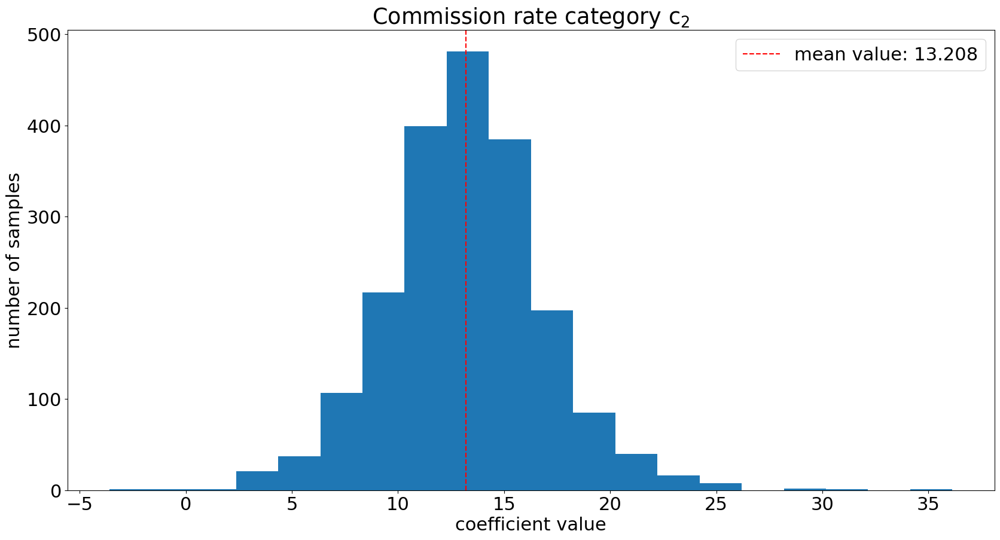

[ 8.8620184  20.82707876]
1.0


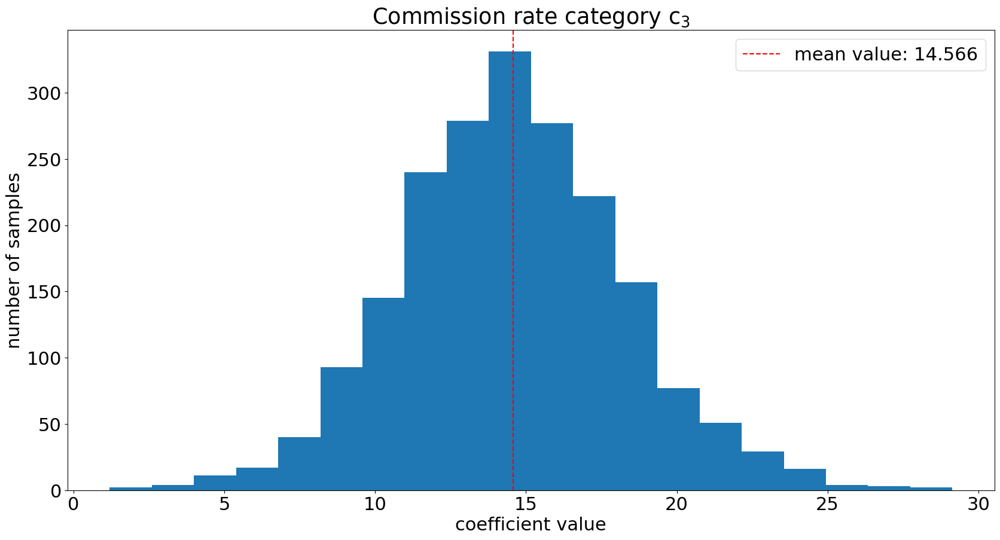

[18.89970252 39.36143737]
1.0


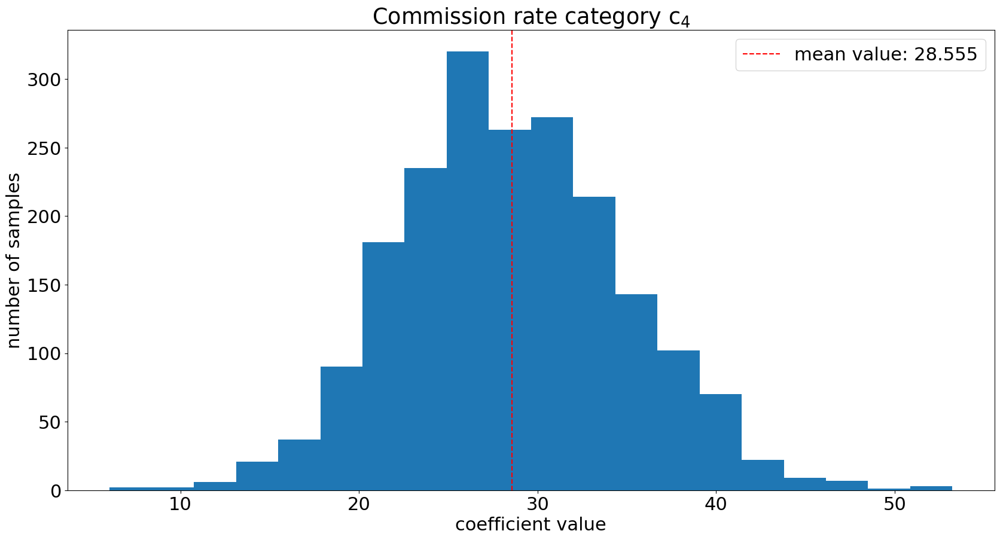

In [67]:
plot_distributions(mu_comm_samples_discount, going_rate_samples_discount)

In [68]:
b_comm_samples_discount = discount_trace['b_comm']

In [69]:
discount_effect_df = calculate_summary_statistics(
    b_comm_samples_discount, mu_comm_samples_discount, market_area_to_index_df)

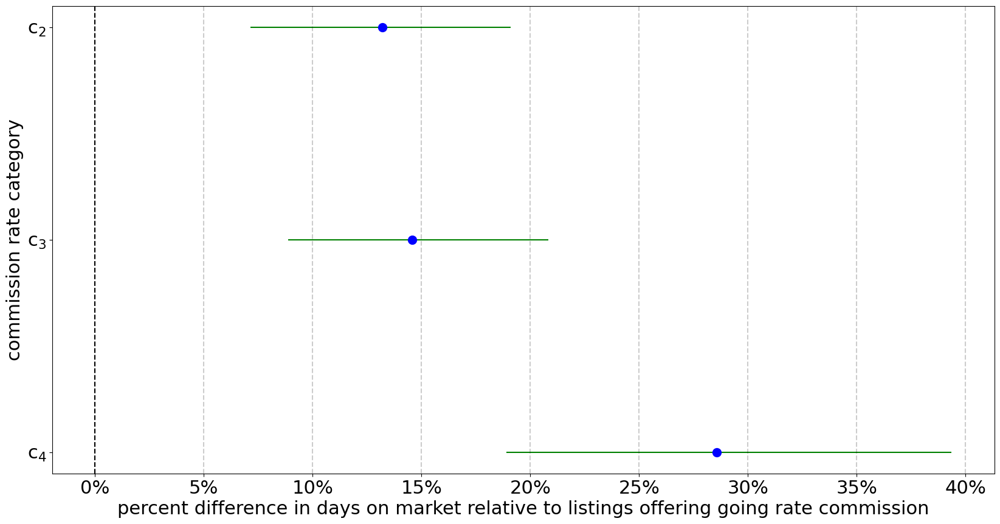

In [70]:
plot_national_effects(discount_effect_df)

In [71]:
alpha = 0.05
for i in range(3):
    print(i)
    sample_diffs = 100 * (np.exp(mu_comm_samples[:, i + 1] - going_rate_samples) - 1)
    sample_diffs_discount = 100 * (np.exp(mu_comm_samples_discount[:, i + 1] - going_rate_samples_discount) - 1)
    discount_diffs = sample_diffs_discount - sample_diffs
    print('mean difference:', discount_diffs.mean())
    print('95% credible interval:', np.quantile(discount_diffs, [alpha / 2, 1 - (alpha / 2)]))
    print('probability discount is greater:', (discount_diffs > 0).mean())

0
mean difference: -2.2791848757031534
95% credible interval: [-14.81319216  10.05043607]
probability discount is greater: 0.3515
1
mean difference: -2.3458155353888013
95% credible interval: [-11.67191704   7.29075972]
probability discount is greater: 0.3015
2
mean difference: -4.1065360169774445
95% credible interval: [-21.37390867  12.77705027]
probability discount is greater: 0.3175
